# K means

In [1]:
# imports

import pandas as pd
import numpy as np
from math import pi
from math import ceil
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import random
import joblib
from tqdm import tqdm
import re
from IPython.display import clear_output
import mapply
mapply.init(n_workers=7, progressbar=True)

/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [161]:
# utils

cat_cols = ['date_month', 'date_day', 'date_year', 'congressional_district', 'state',
        'incident_characteristics1', 'city_or_county', 'party', 'CLEAN', 'OUTLIER']

cat_cols2 = ['date_month', 'date_day', 'date_year', 'congressional_district', 'state',
            'incident_characteristics1', 'city_or_county', 'party']

cat_cols_f = ['party', 'date_day', 'date_month', 'date_year', 'state', 'city_or_county', 'incident_characteristics1']

orig_num_cols = ['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
        'max_age_participants', 'n_participants_child', 'n_participants_teen',
        'n_participants_adult', 'n_males', 'n_females', 'n_killed', 'n_injured',
        'n_arrested', 'n_unharmed', 'n_participants',
        'povertyPercentage', 'candidatevotes', 'totalvotes']

K_MIN = 2
K_MAX = 20

OUTLIERS_REM = 'remove_outliers_iqr'
#OUTLIERS_REM = 'flag'
#SCALER = 'std'
SCALER = 'minmax'

MODEL_NAMES = ['Original Model', 'Augmented Model', 'Indicators Model', 'Original Reduced Model', 'Augmented Reduced Model', 'Indicators Reduced Model']

def remove_outliers_iqr(data, column, threshold=1.5):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

def prepare(df, scaler='std', with_original=True, with_indicators=True):
    df.loc[:, cat_cols2] = df.loc[:, cat_cols2].astype('object')
    numerical_df = df.select_dtypes(include=['int64', 'float64'])

    if not with_indicators:
        if not with_original:
            return None
        numerical_df = numerical_df[orig_num_cols]
    elif not with_original:
        numerical_df = numerical_df[[col for col in numerical_df.columns if col not in orig_num_cols]]

    if scaler == 'minmax':
        scaler = MinMaxScaler()
    else:
        scaler = StandardScaler()
        
    numerical_scaled = scaler.fit_transform(numerical_df.values)
    numerical_scaled = pd.DataFrame(numerical_scaled, columns=numerical_df.columns)

    return numerical_df, numerical_scaled, scaler


def features_reduction_corr(df, correlation_threshold=0.7):
    # Compute the correlation matrix
    correlation_matrix = df.corr()

    # Identify highly correlated features
    highly_correlated_features = set()

    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
                colname = correlation_matrix.columns[i]
                highly_correlated_features.add(colname)

    # Remove highly correlated features
    df_filtered = df.drop(columns=highly_correlated_features)
    return df_filtered


def features_reduction_var(df, variance_threshold=2):
    # Compute the variance of each feature
    feature_variances = df.var()

    # Identify features below the variance threshold
    low_variance_features = feature_variances[feature_variances < variance_threshold].index

    # Prune (remove) features below the threshold
    df_pruned = df.drop(columns=low_variance_features)

    return df_pruned


def k_means(df, k_min, k_max, initial_centroids=None, max_iter=300):
    models = []
    for i in range(k_min):
        models.append(None)

    for k in tqdm(range(k_min, k_max+1)):
        if initial_centroids is None:
            model = KMeans(n_clusters=k, n_init=10, max_iter=max_iter)
        else:
            model = KMeans(n_clusters=k, n_init=10, max_iter=max_iter, init=initial_centroids)
        model.fit(df)
        models.append(model)

    return models


def scores(models, df, model_name, k_min, k_max, sample_size=-1, n_samples=1):
    SSEs = []
    separations = []
    silhouettess = []

    for i in range(0, k_min):
        SSEs.append(None)
        separations.append(None)
        silhouettess.append([])
    
    models = models[k_min:k_max+1]

    k = k_min
    for model in models:
        SSEs.append(model.inertia_)
        separations.append(metrics.davies_bouldin_score(df, model.labels_))

        silhouettes = []

        if n_samples > 0:
            print(f'{model_name}:')
            print(f'k = {k}')
            
            for j in tqdm(range(0, n_samples)):
                if sample_size == -1:
                    sample_size = df.shape[0]   
                sampled_indeces = random.sample(range(df.shape[0]), sample_size)
                sampled_points = [df.iloc[i] for i in sampled_indeces]
                sampled_labels = [model.labels_[i] for i in sampled_indeces]
                silhouettes.append(silhouette_score(sampled_points, sampled_labels))
            clear_output(wait=True)

        silhouettess.append(silhouettes)
        k += 1
    
    scoress_dict = {
        'Model': model_name,
        'SSE': SSEs,
        'Separation': separations,
        'Silhouette': silhouettess
    }

    return scoress_dict


def perform_PCA(df, centroids=None, n_components=2):
    pca = PCA(n_components=n_components)

    points_pca = pca.fit_transform(df)
    if centroids is not None:
        centroids_pca = pca.transform(centroids)
        return points_pca, centroids_pca
    return points_pca


def find_features(df, columns, col_scores, threshold=0.1):
    prev_max_score = max(col_scores)
    actual_cols = [columns.pop(0)]
    
    for col in columns:
        actual_cols.append(col)
        scores, _, _ = k_means(df=df[actual_cols], n_samples=1, sample_size=10000, k_min=2, k_max=10)
        max_score = max(scores)
        if np.abs(prev_max_score - max_score) > 0.1:
            actual_cols.pop()
            print(col + ' discarded')
            print('actual score: ' + str(max_score))
        else:
            if prev_max_score < max_score:
                prev_max_score = max_score
            print(col + ' added')
            print('actual score: ' + str(max_score))
    return actual_cols, prev_max_score


def order_features(df):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    numeric_df = df[numeric_cols]
    columns = numeric_df.columns.tolist()
    #random.shuffle(columns)

    max_scores = []
    for col in columns:
        scores, _, _ = k_means(df=df[[col]], n_samples=1, sample_size=10000, k_min=2, k_max=9)
        max_scores.append(max(scores))

    combined = list(zip(columns, max_scores))
    sorted_combined = sorted(combined, key=lambda x: x[1], reverse=True)
    sorted_cols = [item for item, score in sorted_combined]
    sorted_scores = [score for item, score in sorted_combined]

    return sorted_cols, sorted_scores


def sample_columns(df, num_columns_to_sample=1):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    numeric_df = df[numeric_cols]
    df_reduced = numeric_df.sample(n=num_columns_to_sample, axis=1).copy()
    return df_reduced


def show_scores(model_scores, model_names, k_mins, k_maxs):
    N = len(model_scores)
    labels = list(model_scores[0].keys())+['']
    labels.remove('Model')

    plt.figure(figsize=(4*N, 18))
    
    for j in range(len(labels)):
        label = labels[j]
        for z, i in zip(range(N), np.arange(1, N*4, 4)):
            model_score = model_scores[z]
            model_name = model_names[z]
            k_min = k_mins[z]
            k_max = k_maxs[z]
            k_values = np.arange(k_min, k_max+1)
            if label == 'Silhouette':
                mean_scores = []
                silhouettess = model_score['Silhouette']
                for k in k_values:
                    mean_scores.append(np.mean(np.array(silhouettess[k])))
                values = mean_scores
                plt.subplot(N, 4, i+j)
                plt.ylabel('Silhouette Mean')
            elif label == '':
                var_scores = []
                silhouettess = model_score['Silhouette']
                for k in k_values:
                    var_scores.append(np.var(np.array(silhouettess[k])))
                values = var_scores
                plt.subplot(N, 4, i+j)
                plt.ylabel('Silhouette Variance')
                mean_plotted = False
            else:
                values = model_score[label][k_min:k_max+1]
                plt.subplot(N, 4, i+j)
                plt.ylabel(label)
            plt.plot(k_values, values, marker='o')
            plt.title(model_name)
            plt.xticks(k_values[::2])
            plt.xlabel('Number of clusters')
            
    plt.tight_layout()
    plt.show()


def generate_random_df(stats_df, sample_size=1):
    columns = stats_df['Attribute'].tolist()
    random_row = {}
    for j in tqdm(range(len(columns))):
        col = columns[j]
        to_sample_from = stats_df[stats_df['Attribute'] == col]
        if to_sample_from['Possible Values'][j] is not None:
            random_row[col] = np.random.choice(to_sample_from['Possible Values'][j], size=sample_size)
        else:
            random_row[col] = np.random.uniform(to_sample_from['Min Value'][j], to_sample_from['Max Value'][j], size=sample_size)
    random_df = pd.DataFrame(random_row)
    return random_df



def augment(df):
    # from data cleaning ----------------------------------------------------------------------------------
    augmented_participants = df.copy()

    PREFIX = lambda c: f'p_{c[2:]}'

    participants_cols = ['n_males', 'n_females', 'n_participants_child', 'n_participants_teen', 'n_participants_adult', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed']

    # indicators

    # Age Change wrt the mean in the same (month, congressional_district)
    for col in participants_cols:
        augmented_participants[PREFIX(col)] = augmented_participants[col] / augmented_participants['n_participants']

    augmented_age = augmented_participants.copy()
    PREFIX = lambda cs: [f'month_cd_change_{c}' for c in cs]

    augmented_age = augmented_age.set_index(['date_year', 'date_month', 'state', 'congressional_district'])
    augmented_age = augmented_age.sort_index()

    cols = ['min_age_participants', 'avg_age_participants', 'max_age_participants']
    mean_val = augmented_age.groupby(augmented_age.index.names)[cols].mean()
    augmented_age[PREFIX(cols)] = augmented_age[cols] - mean_val

    augmented_age = augmented_age.reset_index()

    # Age Change wrt the mean in the same (month, state)
    PREFIX = lambda cs: [f'year_state_change_{c}' for c in cs]

    augmented_age = augmented_age.set_index(['date_year', 'state'])
    augmented_age = augmented_age.sort_index()

    cols = ['min_age_participants', 'avg_age_participants', 'max_age_participants']
    mean_val = augmented_age.groupby(augmented_age.index.names)[cols].mean()
    augmented_age[PREFIX(cols)] = augmented_age[cols] - mean_val

    augmented_age = augmented_age.reset_index()


    # Number of participants wrt the sum in that (month, congressional_district)
    augmented_p_ratio = augmented_age.copy()
    PREFIX = lambda cs: [f'month_cd_ratio_{c[2:]}' for c in cs]

    new_params = [p + '_ratio' for p in participants_cols]

    augmented_p_ratio = augmented_p_ratio.set_index(['date_year', 'date_month', 'state', 'congressional_district'])
    augmented_p_ratio = augmented_p_ratio.sort_index()
    sums = augmented_p_ratio.groupby(augmented_p_ratio.index.names)[participants_cols].sum()

    augmented_p_ratio[PREFIX(participants_cols)] = augmented_p_ratio[participants_cols].div(sums, axis=0)
    augmented_p_ratio = augmented_p_ratio.reset_index()

    # Number of participants wrt the sum in that (month, state)
    PREFIX = lambda cs: [f'year_state_ratio_{c[2:]}' for c in cs]

    new_params = [p + '_ratio' for p in participants_cols]

    augmented_p_ratio = augmented_p_ratio.set_index(['date_year', 'state'])
    augmented_p_ratio = augmented_p_ratio.sort_index()
    sums = augmented_p_ratio.groupby(augmented_p_ratio.index.names)[participants_cols].sum()

    augmented_p_ratio[PREFIX(participants_cols)] = augmented_p_ratio[participants_cols].div(sums, axis=0)
    augmented_p_ratio = augmented_p_ratio.reset_index()

    # Replace NaNs (0/0) with 0
    augmented_p_ratio = augmented_p_ratio.fillna(0)

    augmented_incidents = augmented_p_ratio.copy()
    PREFIX = lambda _: 'month_cd_incidents'

    augmented_incidents = augmented_incidents.set_index(['date_year', 'date_month', 'state', 'congressional_district'])
    augmented_incidents = augmented_incidents.sort_index()
    augmented_incidents['month_cd_incidents'] = augmented_incidents.groupby(augmented_incidents.index.names).size()
    augmented_incidents['month_cd_votes_incidents'] = augmented_incidents['month_cd_incidents'] / augmented_incidents['totalvotes']

    augmented_incidents = augmented_incidents.reset_index()

    augmented_incidents = augmented_incidents.set_index(['date_year', 'state'])
    augmented_incidents = augmented_incidents.sort_index()
    augmented_incidents['year_state_incidents'] = augmented_incidents.groupby(augmented_incidents.index.names).size()

    augmented_incidents = augmented_incidents.reset_index()

    augmented_population = augmented_incidents.copy()

    votes = df.copy()
    votes = votes[['date_year', 'state', 'congressional_district', 'totalvotes']]
    votes = votes.set_index(['date_year', 'state', 'congressional_district'])
    votes = votes.sort_index()

    state_votes = votes.groupby(['date_year', 'state']).sum()

    augmented_population = augmented_population.set_index(['date_year', 'state', 'congressional_district'])
    augmented_population = augmented_population.sort_index()

    cd_population = augmented_population['totalvotes'] * augmented_population['state_population'] // state_votes['totalvotes']
    cd_population.dropna(inplace=True)

    augmented_population['cd_population'] = cd_population

    augmented_population = augmented_population.reset_index()

    augmented_party = augmented_population.copy()

    REP_df = augmented_party[augmented_party['party'] == 'REPUBLICAN'].copy()
    DEM_df = augmented_party[augmented_party['party'] == 'DEMOCRAT'].copy()
    REP_df['percentage_republican'] = REP_df['candidatevotes'] / REP_df['totalvotes']
    REP_df['percentage_democrat'] = 1 - (REP_df['candidatevotes'] / REP_df['totalvotes'])
    DEM_df['percentage_democrat'] = DEM_df['candidatevotes'] / DEM_df['totalvotes']
    DEM_df['percentage_republican'] = 1 - (DEM_df['candidatevotes'] / DEM_df['totalvotes'])
    augmented_party = pd.concat([REP_df, DEM_df], ignore_index=True).reset_index(drop=True).sample(frac=1)

    regex = re.compile('[^a-zA-Z0-9]')
    def rename(s):
        return regex.sub('_', s)

    k = 4

    augmented_charateristics = augmented_party.copy()

    vc = augmented_charateristics['incident_characteristics1'].value_counts()
    most_common = vc.head(k).index.tolist()

    augmented_charateristics = augmented_charateristics.set_index(['date_year', 'date_month', 'state', 'congressional_district', 'incident_characteristics1'])
    augmented_charateristics = augmented_charateristics.sort_index()
    something = augmented_charateristics.groupby(['date_year', 'date_month', 'state', 'congressional_district', 'incident_characteristics1']).size()
    morething = augmented_charateristics.groupby(['date_year', 'date_month', 'state', 'congressional_district']).size()

    # create a column for each of the k most common incident_characteristics1 plus a column for the others
    for c in most_common:
        nc = rename(c)
        nc = 'cd_month_' + nc
        perc_state_month = something.xs(c, level='incident_characteristics1') / morething
        perc_state_month.fillna(0, inplace=True)
        augmented_charateristics[nc] = perc_state_month
    nc = 'cd_month_OTHER'
    perc_state_month = 1 - augmented_charateristics[['cd_month_' + rename(c) for c in most_common]].sum(axis=1)
    augmented_charateristics[nc] = perc_state_month

    augmented_charateristics = augmented_charateristics.reset_index()

    augmented_charateristics = augmented_charateristics.set_index(['date_year', 'state', 'incident_characteristics1'])
    augmented_charateristics = augmented_charateristics.sort_index()
    something = augmented_charateristics.groupby(['date_year', 'state', 'incident_characteristics1']).size()
    morething = augmented_charateristics.groupby(['date_year', 'state']).size()

    # create a column for each of the k most common incident_characteristics1 plus a column for the others
    for c in most_common:
        nc = rename(c)
        nc = 'state_year_' + nc
        perc_state_month = something.xs(c, level='incident_characteristics1') / morething
        perc_state_month.fillna(0, inplace=True)
        augmented_charateristics[nc] = perc_state_month
    nc = 'state_year_OTHER'
    perc_state_month = 1 - augmented_charateristics[['state_year_' + rename(c) for c in most_common]].sum(axis=1)
    augmented_charateristics[nc] = perc_state_month

    df = augmented_charateristics.reset_index()
    
    return df

---
## Preparing datasets

In [163]:
df_init = pd.read_csv('./dataset/data/final_clean2.csv')

if OUTLIERS_REM == 'flag':
    df_init = df_init[df_init['OUTLIER'] == 0]
else:
    for col in orig_num_cols:
        df_init = remove_outliers_iqr(df_init, col)

cols = cat_cols2 + orig_num_cols + ['state_population', 'timestamp']
df_init = df_init[cols]
df_init = augment(df_init)
#-------------------------------------------------------------------

summary_stats = pd.DataFrame({
    'Unique Values': df_init.nunique(),
    'Max Value': df_init.max(),
    'Min Value': df_init.min()
})
summary_stats['Possible Values'] = df_init.apply(lambda col: col.unique() if col.nunique() <= 8000 else None)
summary_stats = summary_stats.reset_index().rename(columns={'index': 'Attribute'})

random_df_init = generate_random_df(stats_df=summary_stats, sample_size=len(df_init.values))
random_df_init = augment(random_df_init)

100%|██████████| 77/77 [00:00<00:00, 789.71it/s]


In [ ]:
summary_stats[summary_stats['Attribute'].isin(cat_cols2)]

,Attribute,Unique Values,Max Value,Min Value,Possible Values
0,date_year,6,2018.0,2013.0,"[2013.0, 2014.0, 2015.0, 2016.0, 2017.0, 2018.0]"
1,state,50,WYOMING,ALABAMA,"[ARIZONA, ILLINOIS, INDIANA, MARYLAND, MICHIGA..."
2,incident_characteristics1,47,UNEXPECTED_GUN,ARMED_ROBBERY,"[SHOT_INJURED, MISC, OFFICER_INVOLVED, SHOT_DE..."
3,date_month,12,12,1,"[5, 7, 8, 9, 1, 3, 12, 10, 11, 6, 2, 4]"
4,congressional_district,47,52.0,1.0,"[4.0, 2.0, 7.0, 5.0, 3.0, 8.0, 1.0, 6.0, 9.0, ..."
5,date_day,31,31,1,"[12, 7, 18, 2, 20, 17, 25, 14, 22, 1, 15, 13, ..."
6,city_or_county,7663,Zuni (Zuni Pueblo),Abbeville,"[Gulfport, Lewiston, Horry County, Orlando, Fo..."
7,party,2,REPUBLICAN,DEMOCRAT,"[REPUBLICAN, DEMOCRAT]"


In [ ]:
summary_stats[summary_stats['Attribute'].isin(orig_num_cols + ['state_population', 'timestamp'])]

,Attribute,Unique Values,Max Value,Min Value,Possible Values
8,latitude,54379,48.9399,24.5539,None
9,longitude,60000,-67.2996,-113.062,None
10,min_age_participants,52,52.0,1.0,"[21.0, 22.0, 45.0, 31.0, 43.0, 28.0, 40.0, 34...."
11,avg_age_participants,52,53.0,2.0,"[21.0, 28.0, 45.0, 34.0, 43.0, 22.0, 30.0, 24...."
12,max_age_participants,57,58.0,2.0,"[21.0, 34.0, 45.0, 37.0, 43.0, 22.0, 28.0, 50...."
13,n_participants_child,1,0.0,0.0,[0.0]
14,n_participants_teen,1,0.0,0.0,[0.0]
15,n_participants_adult,3,3.0,1.0,"[2.0, 1.0, 3.0]"
16,n_males,3,3.0,1.0,"[2.0, 1.0, 3.0]"
17,n_females,1,0.0,0.0,[0.0]


### Actual data

Dataset dimentions: (95191, 77)
Dataset dimentions without ouliers, with only numerical cols, without indicators: (95191, 18)
Dataset dimentions without ouliers, with only numerical cols, with indicators: (95191, 69)
Dataset dimentions without ouliers, with only numerical cols, only indicators: (95191, 51)


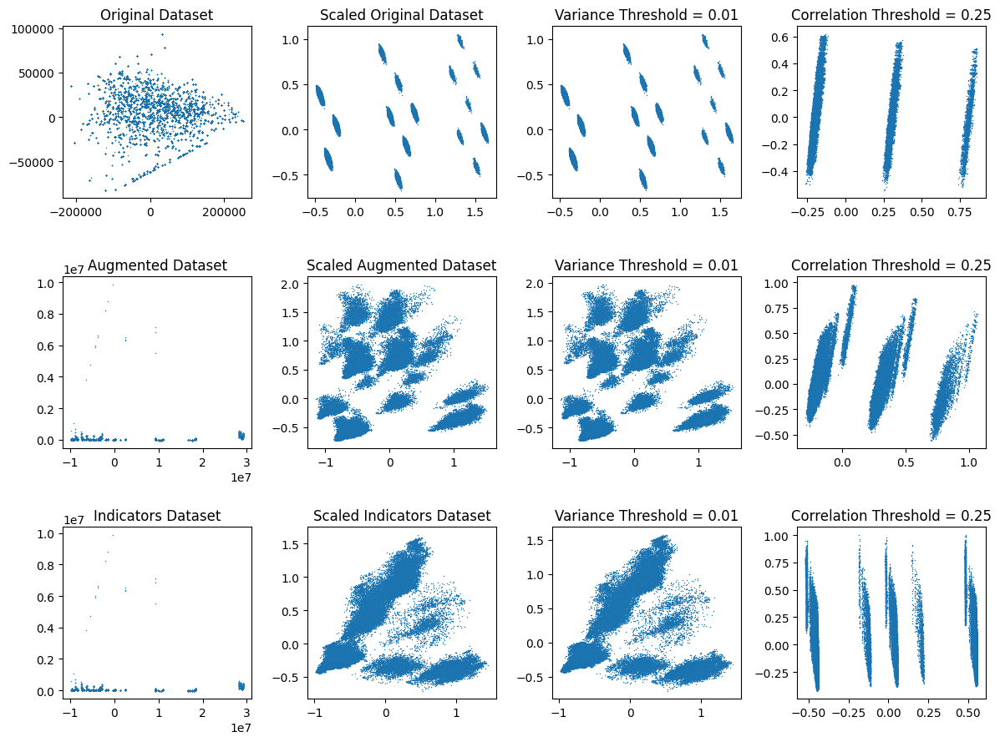

Original Dataset

Initial n_cols = 18

Survived columns (variance_threshold = 0.01):----------------------------------------------
n_cols = 14
Index(['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
       'max_age_participants', 'n_participants_adult', 'n_males', 'n_injured',
       'n_arrested', 'n_unharmed', 'n_participants', 'povertyPercentage',
       'candidatevotes', 'totalvotes'],
      dtype='object')

Survived columns (correlation_threshold = 0.25):----------------------------------------------
n_cols = 4
Index(['latitude', 'longitude', 'min_age_participants',
       'n_participants_adult'],
      dtype='object')

Augmented Dataset

Initial n_cols = 69

Survived columns (variance_threshold = 0.01):----------------------------------------------
n_cols = 42
Index(['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
       'max_age_participants', 'n_participants_adult', 'n_males', 'n_injured',
       'n_arrested', 'n_unharmed', 'n_par

In [ ]:
df_orig, df_orig_s, scaler_orig = prepare(df=df_init, scaler=SCALER, with_indicators=False, with_original=True)
df, df_s, scaler = prepare(df=df_init, scaler=SCALER, with_indicators=True, with_original=True)
df_ind, df_ind_s, scaler_ind = prepare(df=df_init, scaler=SCALER, with_indicators=True, with_original=False)

print(f'Dataset dimentions: {df_init.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, without indicators: {df_orig.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, with indicators: {df.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, only indicators: {df_ind.shape}')

dataframes = [df_orig, df, df_ind]
scaled_dataframes = [df_orig_s, df_s, df_ind_s]
scalers = [scaler_orig, scaler, scaler_ind]
titles = ['Original Dataset', 'Augmented Dataset', 'Indicators Dataset']
N = len(dataframes)

if SCALER == 'minmax':
    var_thr = 0.01
    corr_thr = 0.25
else:
    var_thr = 0
    corr_thr = 0.25

reduced1s = []
reduced2s = []

for ds in scaled_dataframes:
    rs1 = features_reduction_var(ds, variance_threshold=var_thr)
    rs2 = features_reduction_corr(rs1, correlation_threshold=corr_thr)
    reduced1s.append(rs1)
    reduced2s.append(rs2)

scaled_dataframes = scaled_dataframes + reduced2s
dataframes = dataframes*2
scalers = scalers*2

plt.figure(figsize=(12, 9))

for d, ds, rs1, rs2, t, i in zip(dataframes, scaled_dataframes, reduced1s, reduced2s, titles, np.arange(1, N*4, 4)):

    pca = perform_PCA(df=d, n_components=2)
    pca_s = perform_PCA(df=ds, n_components=2)
    pca_rs1 = perform_PCA(df=rs1, n_components=2)
    pca_rs2 = perform_PCA(df=rs2, n_components=2)

    plt.subplot(3, 4, i)
    plt.scatter(pca[:, 0], pca[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(t)

    plt.subplot(3, 4, i+1)
    plt.scatter(pca_s[:, 0], pca_s[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Scaled {t}')

    plt.subplot(3, 4, i+2)
    plt.scatter(pca_rs1[:, 0], pca_rs1[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Variance Threshold = {var_thr}')

    plt.subplot(3, 4, i+3)
    plt.scatter(pca_rs2[:, 0], pca_rs2[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Correlation Threshold = {corr_thr}')

plt.tight_layout()
plt.show()

for ds, rs1, rs2, t in zip(scaled_dataframes, reduced1s, reduced2s, titles):
    print(f'{t}\n\nInitial n_cols = {ds.shape[1]}')
    print(f'\nSurvived columns (variance_threshold = {var_thr}):----------------------------------------------')
    print(f'n_cols = {len(rs1.columns)}')
    print(rs1.columns)

    print(f'\nSurvived columns (correlation_threshold = {corr_thr}):----------------------------------------------')
    print(f'n_cols = {len(rs2.columns)}')
    print(f'{rs2.columns}\n')

### Random data

Dataset dimentions: (95191, 83)
Dataset dimentions without ouliers, with only numerical cols, without indicators: (95191, 18)
Dataset dimentions without ouliers, with only numerical cols, with indicators: (95191, 75)
Dataset dimentions without ouliers, with only numerical cols, only indicators: (95191, 57)


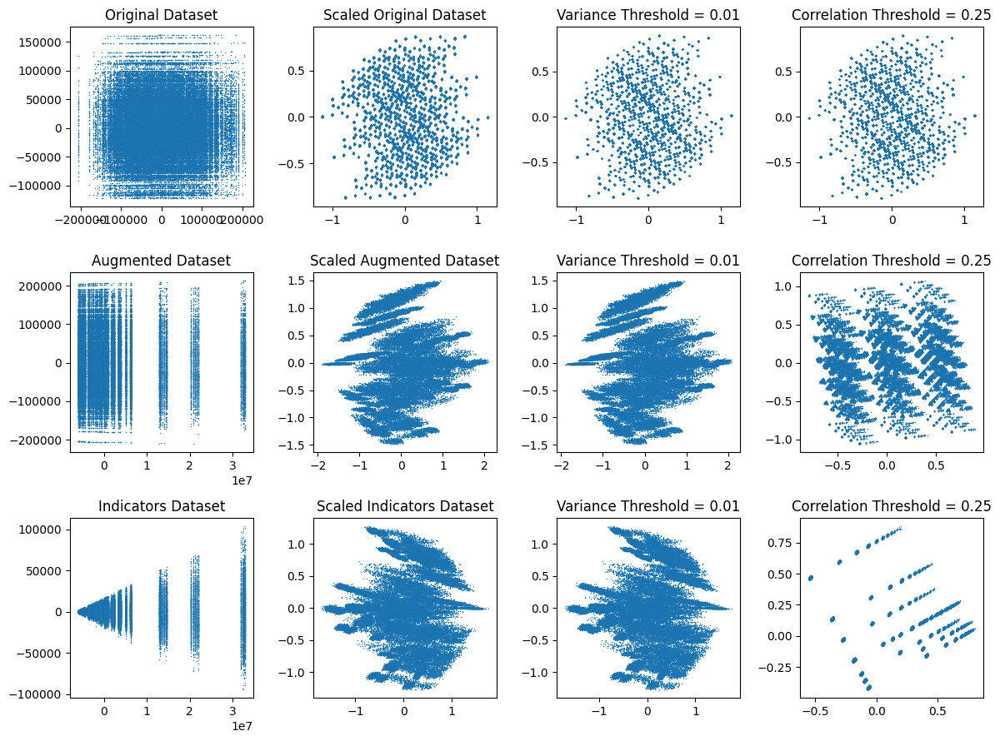

Original Dataset

Initial n_cols = 18

Survived columns (variance_threshold = 0.01):----------------------------------------------
n_cols = 14
Index(['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
       'max_age_participants', 'n_participants_adult', 'n_males', 'n_injured',
       'n_arrested', 'n_unharmed', 'n_participants', 'povertyPercentage',
       'candidatevotes', 'totalvotes'],
      dtype='object')

Survived columns (correlation_threshold = 0.25):----------------------------------------------
n_cols = 14
Index(['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
       'max_age_participants', 'n_participants_adult', 'n_males', 'n_injured',
       'n_arrested', 'n_unharmed', 'n_participants', 'povertyPercentage',
       'candidatevotes', 'totalvotes'],
      dtype='object')

Augmented Dataset

Initial n_cols = 75

Survived columns (variance_threshold = 0.01):----------------------------------------------
n_cols = 56
Index(['latitu

In [ ]:
random_df_orig, random_df_orig_s, random_scaler_orig = prepare(df=random_df_init, scaler=SCALER, with_indicators=False, with_original=True)
random_df, random_df_s, random_scaler = prepare(df=random_df_init, scaler=SCALER, with_indicators=True, with_original=True)
random_df_ind, random_df_ind_s, random_scaler_ind = prepare(df=random_df_init, scaler=SCALER, with_indicators=True, with_original=False)

print(f'Dataset dimentions: {random_df_init.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, without indicators: {random_df_orig.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, with indicators: {random_df.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, only indicators: {random_df_ind.shape}')

random_dataframes = [random_df_orig, random_df, random_df_ind]
random_scaled_dataframes = [random_df_orig_s, random_df_s, random_df_ind_s]
random_scalers = [random_scaler_orig, random_scaler, random_scaler_ind]
titles = ['Original Dataset', 'Augmented Dataset', 'Indicators Dataset']
N = len(random_dataframes)

if SCALER == 'minmax':
    var_thr = 0.01
    corr_thr = 0.25
else:
    var_thr = 0
    corr_thr = 0.25

reduced1s = []
reduced2s = []

for ds in random_scaled_dataframes:
    rs1 = features_reduction_var(ds, variance_threshold=var_thr)
    rs2 = features_reduction_corr(rs1, correlation_threshold=corr_thr)
    reduced1s.append(rs1)
    reduced2s.append(rs2)

random_scaled_dataframes = random_scaled_dataframes + reduced2s
random_dataframes = random_dataframes*2
random_scalers = random_scalers*2

plt.figure(figsize=(12, 9))

for d, ds, rs1, rs2, t, i in zip(random_dataframes, random_scaled_dataframes, reduced1s, reduced2s, titles, np.arange(1, N*4, 4)):

    pca = perform_PCA(df=d, n_components=2)
    pca_s = perform_PCA(df=ds, n_components=2)
    pca_rs1 = perform_PCA(df=rs1, n_components=2)
    pca_rs2 = perform_PCA(df=rs2, n_components=2)

    plt.subplot(3, 4, i)
    plt.scatter(pca[:, 0], pca[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(t)

    plt.subplot(3, 4, i+1)
    plt.scatter(pca_s[:, 0], pca_s[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Scaled {t}')

    plt.subplot(3, 4, i+2)
    plt.scatter(pca_rs1[:, 0], pca_rs1[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Variance Threshold = {var_thr}')

    plt.subplot(3, 4, i+3)
    plt.scatter(pca_rs2[:, 0], pca_rs2[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Correlation Threshold = {corr_thr}')

plt.tight_layout()
plt.show()

for ds, rs1, rs2, t in zip(random_scaled_dataframes, reduced1s, reduced2s, titles):
    print(f'{t}\n\nInitial n_cols = {ds.shape[1]}')
    print(f'\nSurvived columns (variance_threshold = {var_thr}):----------------------------------------------')
    print(f'n_cols = {len(rs1.columns)}')
    print(rs1.columns)

    print(f'\nSurvived columns (correlation_threshold = {corr_thr}):----------------------------------------------')
    print(f'n_cols = {len(rs2.columns)}')
    print(f'{rs2.columns}\n')

---
# K-means clustering

#### Clustering

In [ ]:
N = len(scaled_dataframes)

modelss = []
for dataframe in scaled_dataframes:
    modelss.append(k_means(dataframe, k_min=K_MIN, k_max=K_MAX, max_iter=1000000))

100%|██████████| 19/19 [00:48<00:00,  2.58s/it]


#### Evaluation and k selection

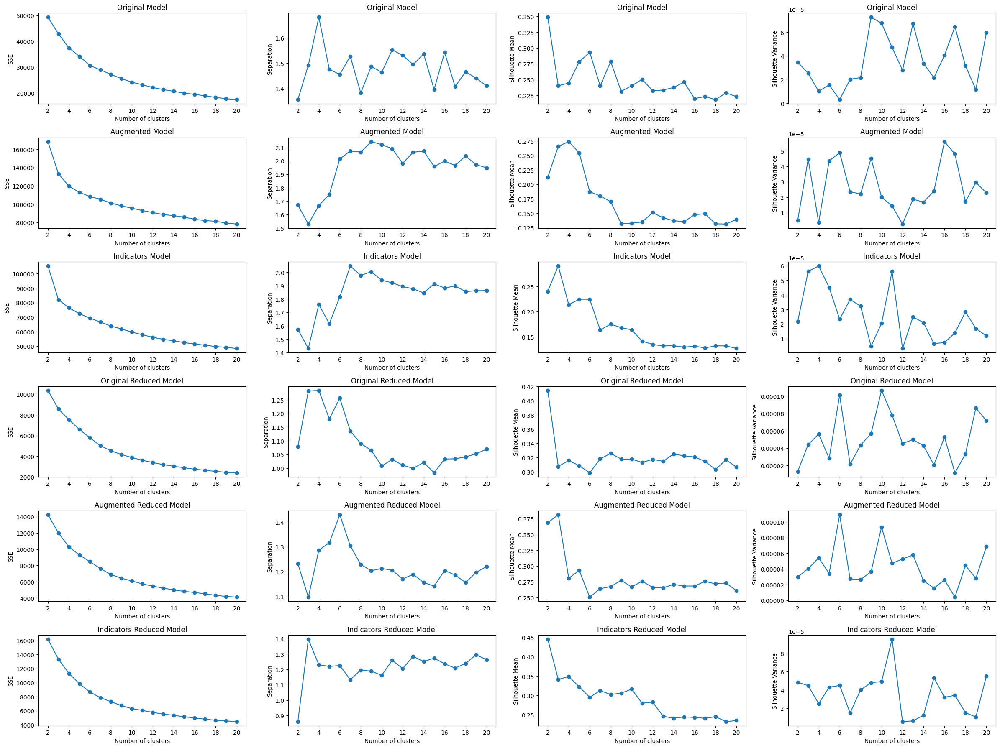

In [ ]:
best_ks = []
model_scores = []

for models, model_name, dataframe in zip(modelss, MODEL_NAMES, scaled_dataframes):
    score_dict = scores(models=models, df=dataframe, model_name=model_name, k_min=K_MIN, k_max=K_MAX, sample_size=1000, n_samples=5)
    model_scores.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(K_MIN, K_MAX+1)]
    best_ks.append(np.argmax(mean_sils)+K_MIN)
show_scores(model_scores=model_scores, model_names=MODEL_NAMES, k_mins=[K_MIN]*N, k_maxs=[K_MAX]*N)

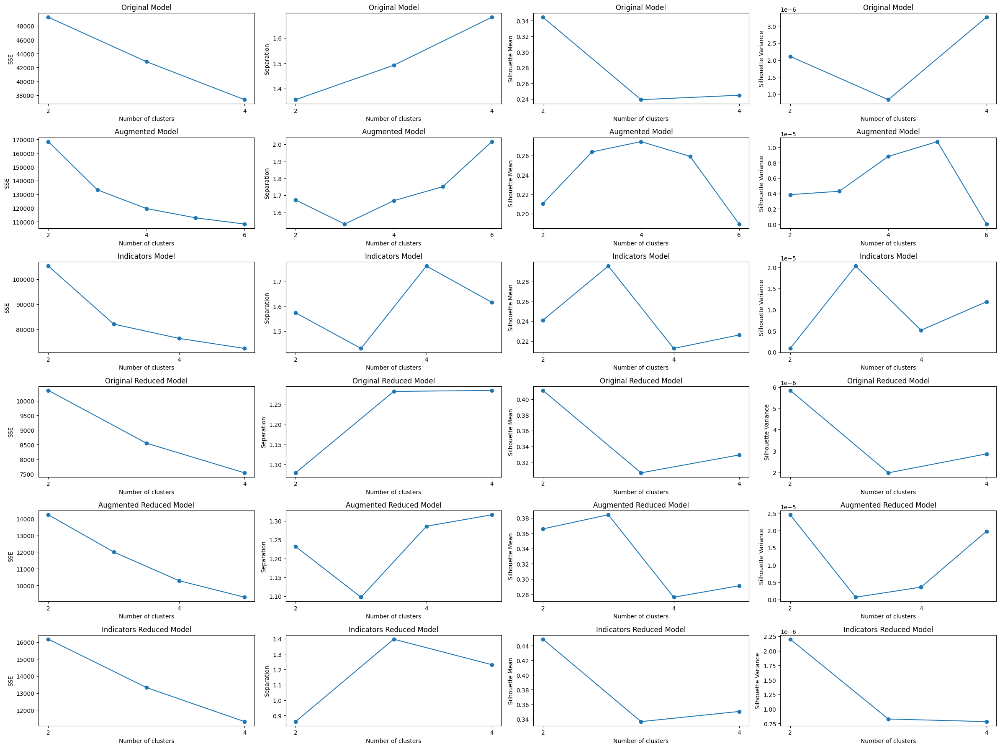

In [ ]:
best_k2s = []
model_score2s = []
k_mins = []
k_maxs = []

for models, model_name, best_k, dataframe in zip(modelss, MODEL_NAMES, best_ks, scaled_dataframes):
    k_min = np.max([best_k-2, K_MIN])
    k_max = np.min([best_k+2, K_MAX])
    k_mins.append(k_min)
    k_maxs.append(k_max)
    score_dict = scores(models=models, df=dataframe, model_name=model_name, k_min=k_min, k_max=k_max, sample_size=5000, n_samples=3)
    model_score2s.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(k_min, k_max+1)]
    best_k2s.append(np.argmax(mean_sils)+k_min)

show_scores(model_scores=model_score2s, model_names=MODEL_NAMES, k_mins=k_mins, k_maxs=k_maxs)

#### Evaluation and stats

Original Model:
k = 2
SSE = 49250.535025302175
Separation = 1.3558916275942767
Silhouette Mean = 0.34190742369515464
Silhouette Variance = 2.716523841498822e-06

Augmented Model:
k = 4
SSE = 119548.2484514273
Separation = 1.667130053222682
Silhouette Mean = 0.27337613285790446
Silhouette Variance = 8.380057067464169e-06

Indicators Model:
k = 3
SSE = 82066.60476935847
Separation = 1.4306852649500506
Silhouette Mean = 0.29241560124251076
Silhouette Variance = 1.0920289273120686e-06

Original Reduced Model:
k = 2
SSE = 10355.219512313382
Separation = 1.0783601685176456
Silhouette Mean = 0.41510207256548154
Silhouette Variance = 7.220957055120567e-07

Augmented Reduced Model:
k = 3
SSE = 12005.25874157374
Separation = 1.0973387429207253
Silhouette Mean = 0.3853709968925137
Silhouette Variance = 5.471591181743236e-07

Indicators Reduced Model:
k = 2
SSE = 16175.918057746345
Separation = 0.8605863203280517
Silhouette Mean = 0.453777919641805
Silhouette Variance = 3.0485818034987484e-08



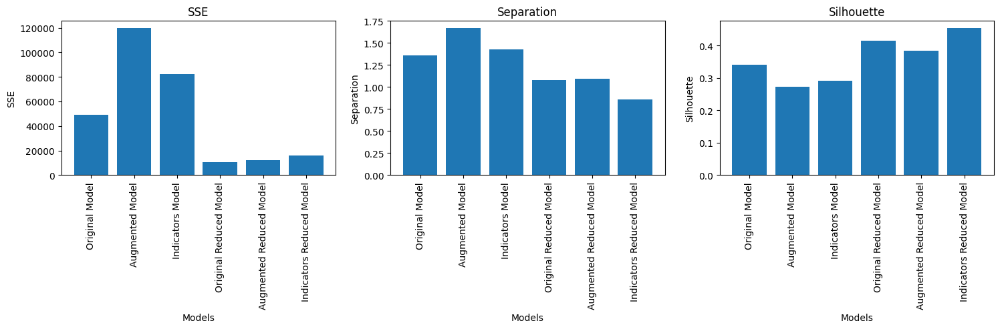

In [ ]:
model_score3s = []
best_scores = []
best_models = []
file_names = ['orig', 'augm', 'ind', 'orig_r', 'augm_r', 'ind_r']
for models, model_name, best_k, dataframe, f in zip(modelss, MODEL_NAMES, best_k2s, scaled_dataframes, file_names):
    model_score = scores(models=models, model_name=model_name, df=dataframe, k_min=best_k, k_max=best_k, sample_size=10000, n_samples=3)
    model_score3s.append(model_score)

    best_scores.append({
        'SSE': model_score['SSE'][best_k],
        'Separation': model_score['Separation'][best_k],
        'Silhouette': np.mean(model_score['Silhouette'][best_k])
    })
    best_models.append(models[best_k])

    if SCALER == 'minmax':
        joblib.dump(models[best_k], f'models/best_kmeans_{f}_mms.pkl')
        for i in range(len(models)):
            joblib.dump(models[i], f'models/kmeans{i}_{f}_mms.pkl')
    else:
        joblib.dump(models[best_k], f'models/best_kmeans_{f}_ss.pkl')
        for i in range(len(models)):
            joblib.dump(models[i], f'models/kmeans{i}_{f}_ss.pkl')

pd.DataFrame(model_scores).to_csv('models/model_scores.csv', index=True)
pd.DataFrame(model_score2s).to_csv('models/model_score2s.csv', index=True)
pd.DataFrame(model_score3s).to_csv('models/model_score3s.csv', index=True)

for s, best_k in zip(model_score3s, best_k2s):
    for key in s:
        if key == 'Silhouette':
            print(f'{key} Mean = {np.mean(s[key][best_k])}')
            print(f'{key} Variance = {np.var(s[key][best_k])}')
        elif key == 'Model':
            print(f'{s[key]}:\nk = {best_k}')
        else:
            print(f'{key} = {s[key][best_k]}')
    print('')

plt.figure(figsize=(18, 3))
for key, i in zip(best_scores[0].keys(), range(len(best_scores[0].keys()))):
    values = [s[key] for s in best_scores]
    plt.subplot(1, 3, i+1)
    plt.bar(MODEL_NAMES, values)
    plt.xticks(rotation=90)
    plt.xlabel('Models')
    plt.ylabel(key)
    plt.title(key)
plt.show()

Silhouette on original data space

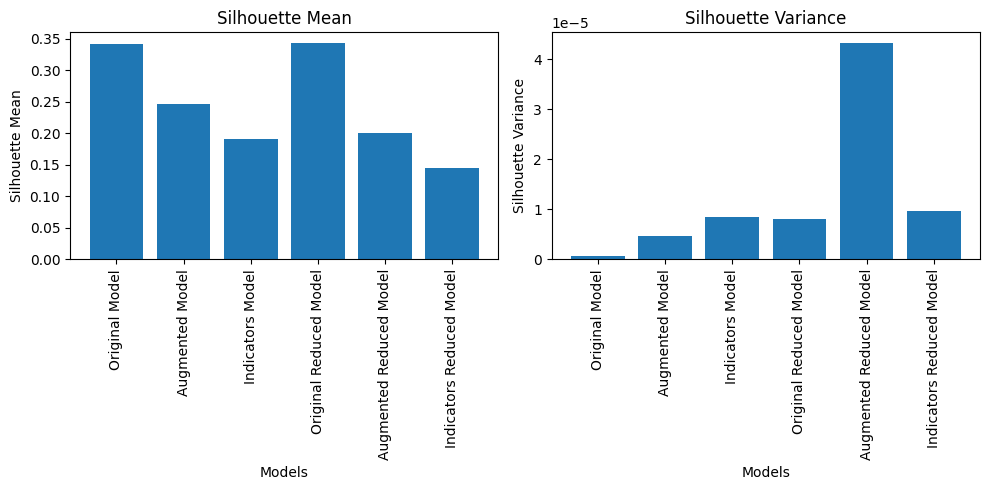

Silhouette scores (avg) on the original dataset:
Original Model (k = 2): 0.3423955199785279
Augmented Model (k = 4): 0.2469101082450751
Indicators Model (k = 3): 0.19066780326902372
Original Reduced Model (k = 2): 0.3429710390500877
Augmented Reduced Model (k = 3): 0.20017303633411662
Indicators Reduced Model (k = 2): 0.14443199024624226


In [ ]:
n_samples = 5
sample_size = 5000
silhouettess = {}
for model, model_name in zip(best_models, MODEL_NAMES):
    silhouettes = []
    print(f'{model_name} (k = {len(model.cluster_centers_)}):')     
    for j in tqdm(range(0, n_samples)):   
        sampled_indeces = random.sample(range(df_orig_s.shape[0]), sample_size)
        sampled_points = [df_orig_s.iloc[i] for i in sampled_indeces]
        sampled_labels = [model.labels_[i] for i in sampled_indeces]
        silhouettes.append(silhouette_score(sampled_points, sampled_labels))
    silhouettess[model_name] = silhouettes
pd.DataFrame(silhouettess).to_csv('models/silhouette_on_orig.csv')

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
mvalues = [np.mean(silhouettes) for silhouettes in silhouettess.values()]
plt.bar(MODEL_NAMES, mvalues)
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Silhouette Mean')
plt.title('Silhouette Mean')

plt.subplot(1, 2, 2)
vvalues = [np.var(silhouettes) for silhouettes in silhouettess.values()]
plt.bar(MODEL_NAMES, vvalues)
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Silhouette Variance')
plt.title('Silhouette Variance')

plt.tight_layout()
plt.show()

print('Silhouette scores (avg) on the original dataset:')
for model, model_name, val in zip(best_models, MODEL_NAMES, mvalues):
    print(f'{model_name} (k = {len(model.cluster_centers_)}): {val}')

#### Clustering visualization (PCA)

/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with f

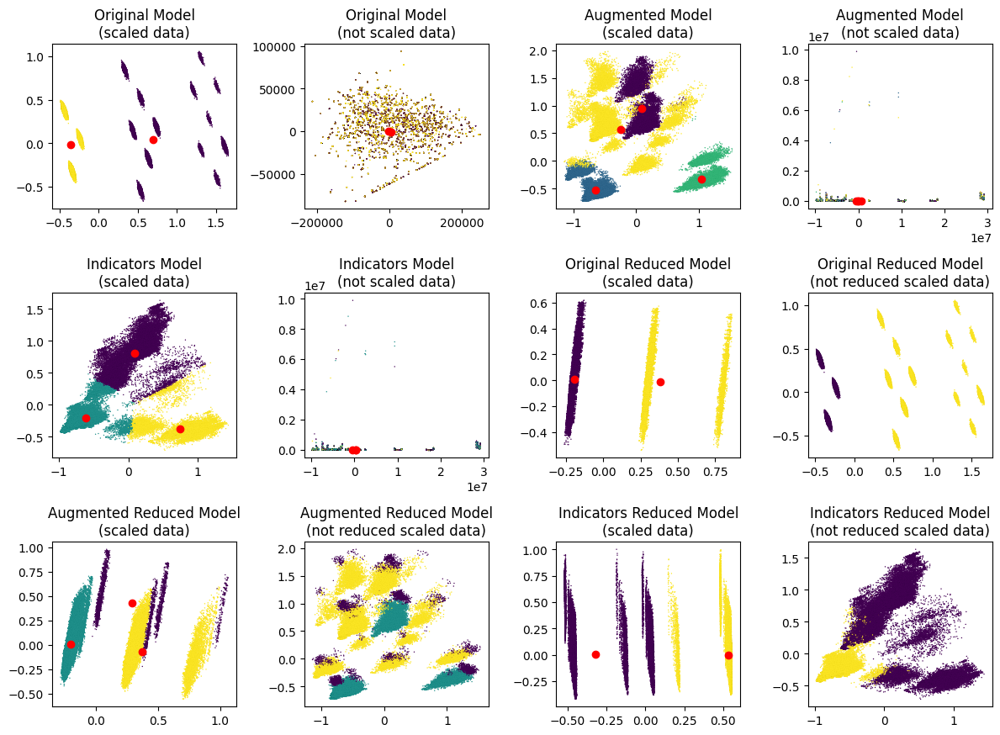

Original Model:
Cluster 0: 32229 points
Cluster 1: 62962 points

Augmented Model:
Cluster 0: 15245 points
Cluster 1: 34326 points
Cluster 2: 24947 points
Cluster 3: 20673 points

Indicators Model:
Cluster 0: 24745 points
Cluster 1: 40367 points
Cluster 2: 30079 points

Original Reduced Model:
Cluster 0: 62962 points
Cluster 1: 32229 points

Augmented Reduced Model:
Cluster 0: 4309 points
Cluster 1: 60842 points
Cluster 2: 30040 points

Indicators Reduced Model:
Cluster 0: 59466 points
Cluster 1: 35725 points



In [ ]:
plt.figure(figsize=(12, 9))

for i, j in zip(range(len(best_models)), np.arange(1, len(best_models)*2, 2)):
    model = best_models[i]
    model_name = MODEL_NAMES[i]
    dataframe = dataframes[i]
    scaled_dataframe = scaled_dataframes[i]
    scaler = scalers[i]
    labels = model.labels_
    centroids = model.cluster_centers_
    points_pca_s, centroids_pca_s = perform_PCA(df=scaled_dataframe, centroids=centroids, n_components=2)

    plt.subplot(3, 4, j)
    plt.scatter(points_pca_s[:, 0], points_pca_s[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
    plt.scatter(centroids_pca_s[:, 0], centroids_pca_s[:, 1], c='red', marker='o')
    plt.title(f'{model_name}\n(scaled data)')

    plt.subplot(3, 4, j+1)
    if 'Reduced' in model_name:
        points_pca = perform_PCA(df=scaled_dataframes[i-3], n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.title(f'{model_name}\n(not reduced scaled data)')

    else:
        points_pca, centroids_pca = perform_PCA(df=dataframe, centroids=scaler.inverse_transform(centroids), n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], c='red', marker='o')
        plt.title(f'{model_name}\n(not scaled data)')

plt.tight_layout()
plt.show()

for model, model_name in zip(best_models, MODEL_NAMES):
    print(f'{model_name}:')
    cluster_labels, cluster_counts = np.unique(model.labels_, return_counts=True)
    for l, c in zip(cluster_labels, cluster_counts):
        print(f'Cluster {l}: {c} points')
    print('')

#### Centroids

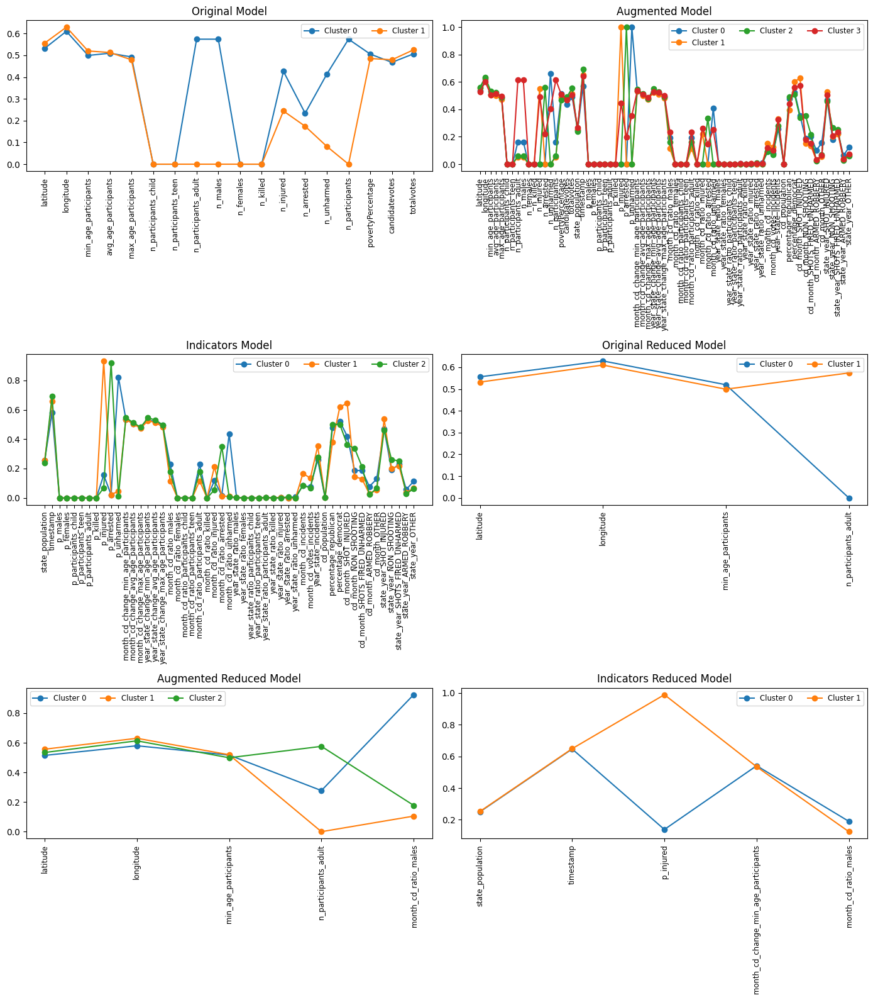

Original Model -> cutted 9 columns
Augmented Model -> cutted 32 columns
Indicators Model -> cutted 27 columns
Original Reduced Model -> cutted 1 columns
Augmented Reduced Model -> cutted 1 columns
Indicators Reduced Model -> cutted 3 columns

['latitude', 'min_age_participants', 'n_participants_adult', 'n_males', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants', 'povertyPercentage']
['latitude', 'longitude', 'min_age_participants', 'n_participants_adult', 'n_males', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants', 'povertyPercentage', 'candidatevotes', 'totalvotes', 'state_population', 'timestamp', 'p_injured', 'p_arrested', 'p_unharmed', 'month_cd_ratio_males', 'month_cd_ratio_participants_adult', 'month_cd_ratio_injured', 'month_cd_ratio_arrested', 'month_cd_ratio_unharmed', 'month_cd_incidents', 'month_cd_votes_incidents', 'year_state_incidents', 'percentage_republican', 'percentage_democrat', 'cd_month_SHOT_INJURED', 'cd_month_NON_SHOOTING', 'cd_month_SHOTS_FIRED

In [ ]:
# plot centroids

plt.figure(figsize=(14, 16))
for i in range(len(best_models)):
    centers = best_models[i].cluster_centers_
    cols = scaled_dataframes[i].columns
    model_name = MODEL_NAMES[i]
    plt.subplot(3, 2, i+1)
    plt.title(model_name)
    for j in range(len(centers)):
        plt.plot(centers[j], marker='o', label=f'Cluster {j}')
        plt.xticks(range(len(cols)), cols, rotation=90, fontsize='small')
        plt.legend(fontsize='small', ncol=3)
plt.tight_layout()
plt.show()

new_colss = []
for model, model_name, dataframe in zip(best_models, MODEL_NAMES, scaled_dataframes):
    centers = model.cluster_centers_
    cols = dataframe.columns
    survived_cols = []
    for i in range(len(cols)):
        std_dev = np.std([center[i] for center in centers])
        if std_dev > 0.01:#0.05:
            survived_cols.append(cols[i])
    print(f'{model_name} -> cutted {len(cols)-len(survived_cols)} columns')
    new_colss.append(survived_cols)
print('')    
for cols in new_colss:
    print(cols)

---
## K-means clustering on random data

#### K means clustering

In [ ]:
N = len(random_scaled_dataframes)

random_modelss = []
for dataframe in random_scaled_dataframes:
    random_modelss.append(k_means(dataframe, k_min=K_MIN, k_max=K_MAX, max_iter=1000000))

100%|██████████| 19/19 [01:16<00:00,  4.02s/it]


#### Evaluation and k selection

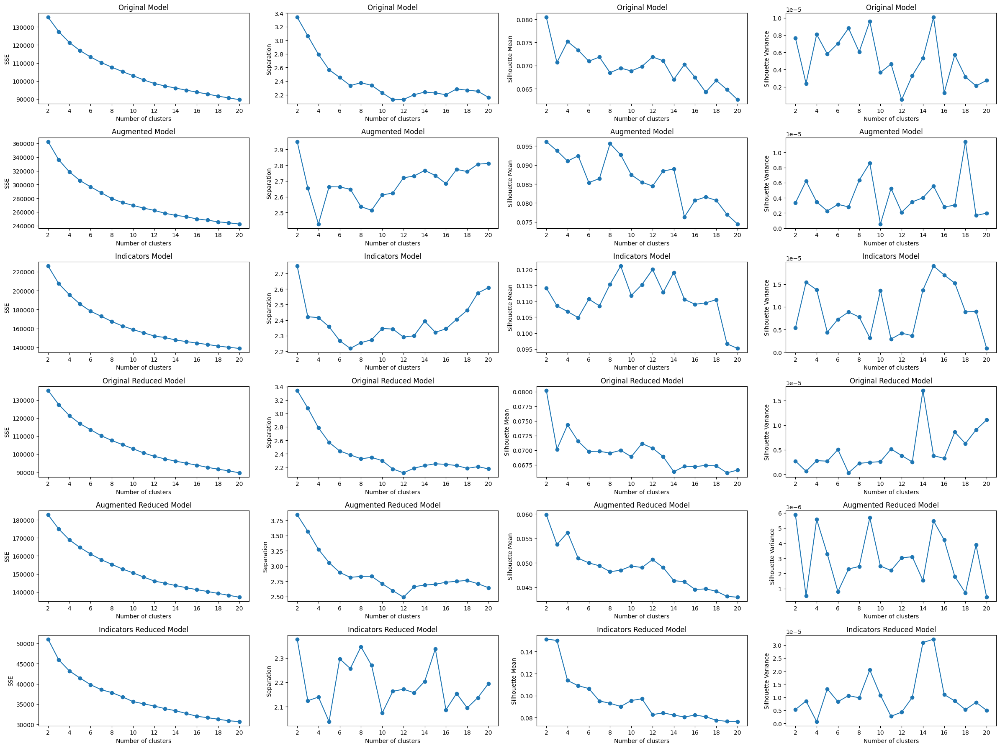

In [ ]:
best_ks = []
random_model_scores = []

for models, model_name, dataframe in zip(random_modelss, MODEL_NAMES, random_scaled_dataframes):
    score_dict = scores(models=models, df=dataframe, model_name=model_name, k_min=K_MIN, k_max=K_MAX, sample_size=1000, n_samples=5)
    random_model_scores.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(K_MIN, K_MAX+1)]
    best_ks.append(np.argmax(mean_sils)+K_MIN)
show_scores(model_scores=random_model_scores, model_names=MODEL_NAMES, k_mins=[K_MIN]*N, k_maxs=[K_MAX]*N)

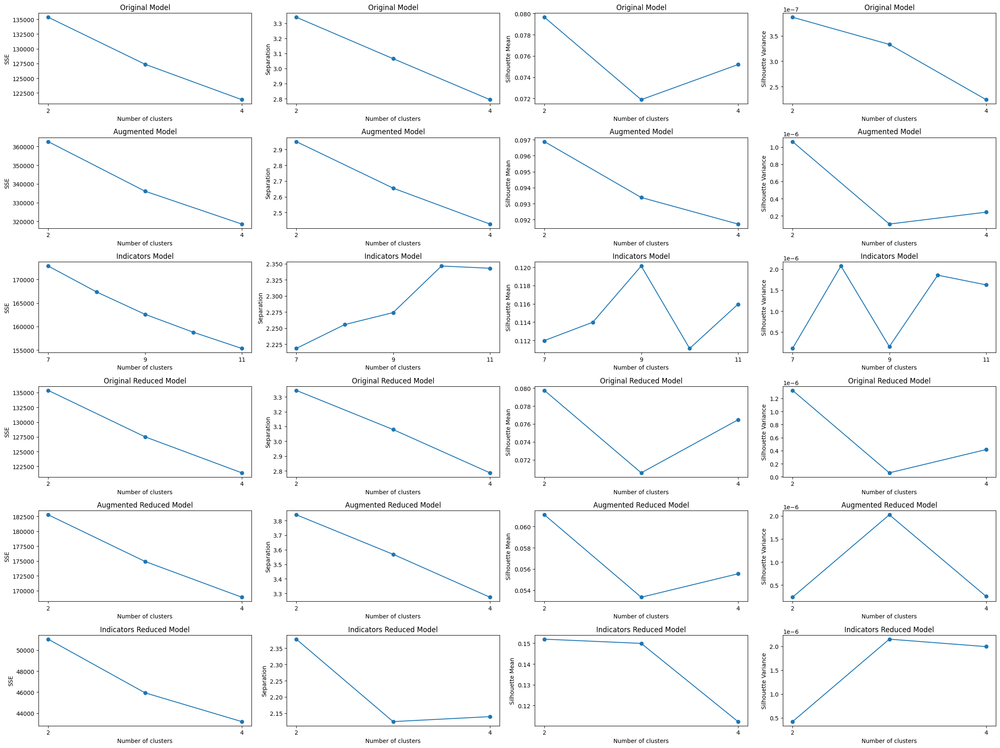

In [ ]:
best_k2s = []
random_model_score2s = []
k_mins = []
k_maxs = []

for models, model_name, best_k, dataframe in zip(random_modelss, MODEL_NAMES, best_ks, random_scaled_dataframes):
    k_min = np.max([best_k-2, K_MIN])
    k_max = np.min([best_k+2, K_MAX])
    k_mins.append(k_min)
    k_maxs.append(k_max)
    score_dict = scores(models=models, df=dataframe, model_name=model_name, k_min=k_min, k_max=k_max, sample_size=5000, n_samples=3)
    random_model_score2s.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(k_min, k_max+1)]
    best_k2s.append(np.argmax(mean_sils)+k_min)

show_scores(model_scores=random_model_score2s, model_names=MODEL_NAMES, k_mins=k_mins, k_maxs=k_maxs)

#### Evaluation and stats

Original Model:
k = 2
SSE = 135345.50452848268
Separation = 3.3397218538716054
Silhouette Mean = 0.07915453594790568
Silhouette Variance = 8.087559791491763e-08

Augmented Model:
k = 2
SSE = 362594.874609958
Separation = 2.9491340481719575
Silhouette Mean = 0.09654023315798681
Silhouette Variance = 7.589902200442982e-07

Indicators Model:
k = 9
SSE = 162593.0833654872
Separation = 2.274093674627471
Silhouette Mean = 0.12167655444201354
Silhouette Variance = 8.163105222922021e-07

Original Reduced Model:
k = 2
SSE = 135374.60780851232
Separation = 3.343939349868237
Silhouette Mean = 0.07973001211175668
Silhouette Variance = 1.252410536690058e-07

Augmented Reduced Model:
k = 2
SSE = 182799.45907271875
Separation = 3.8398145096732113
Silhouette Mean = 0.06123024167623355
Silhouette Variance = 1.6240489649180376e-07

Indicators Reduced Model:
k = 2
SSE = 51037.39652737016
Separation = 2.377559694111581
Silhouette Mean = 0.1522928608998246
Silhouette Variance = 1.1368805426931396e-06



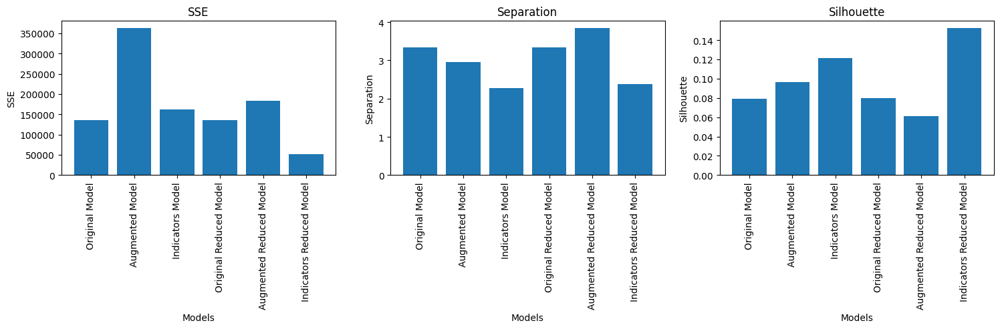

In [ ]:
random_model_score3s = []
best_scores = []
best_models = []
file_names = ['orig', 'augm', 'ind', 'orig_r', 'augm_r', 'ind_r']
for models, model_name, best_k, dataframe, f in zip(random_modelss, MODEL_NAMES, best_k2s, random_scaled_dataframes, file_names):
    model_score = scores(models=models, model_name=model_name, df=dataframe, k_min=best_k, k_max=best_k, sample_size=10000, n_samples=3)
    random_model_score3s.append(model_score)

    best_scores.append({
        'SSE': model_score['SSE'][best_k],
        'Separation': model_score['Separation'][best_k],
        'Silhouette': np.mean(model_score['Silhouette'][best_k])
    })
    best_models.append(models[best_k])

    if SCALER == 'minmax':
        joblib.dump(models[best_k], f'models/random_best_kmeans_{f}_mms.pkl')
        for i in range(len(models)):
            joblib.dump(models[i], f'models/random_kmeans{i}_{f}_mms.pkl')
    else:
        joblib.dump(models[best_k], f'models/random_best_kmeans_{f}_ss.pkl')
        for i in range(len(models)):
            joblib.dump(models[i], f'models/random_kmeans{i}_{f}_ss.pkl')

pd.DataFrame(random_model_scores).to_csv('models/random_model_scores.csv', index=True)
pd.DataFrame(random_model_score2s).to_csv('models/random_model_score2s.csv', index=True)
pd.DataFrame(random_model_score3s).to_csv('models/random_model_score3s.csv', index=True)

for s, best_k in zip(random_model_score3s, best_k2s):
    for key in s:
        if key == 'Silhouette':
            print(f'{key} Mean = {np.mean(s[key][best_k])}')
            print(f'{key} Variance = {np.var(s[key][best_k])}')
        elif key == 'Model':
            print(f'{s[key]}:\nk = {best_k}')
        else:
            print(f'{key} = {s[key][best_k]}')
    print('')

plt.figure(figsize=(18, 3))
for key, i in zip(best_scores[0].keys(), range(len(best_scores[0].keys()))):
    values = [s[key] for s in best_scores]
    plt.subplot(1, 3, i+1)
    plt.bar(MODEL_NAMES, values)
    plt.xticks(rotation=90)
    plt.xlabel('Models')
    plt.ylabel(key)
    plt.title(key)
plt.show()

Silhouette on the original data space

Original Model (k = 2):


100%|██████████| 5/5 [00:19<00:00,  3.89s/it]


Augmented Model (k = 2):


100%|██████████| 5/5 [00:15<00:00,  3.19s/it]


Indicators Model (k = 9):


100%|██████████| 5/5 [00:26<00:00,  5.21s/it]


Original Reduced Model (k = 2):


100%|██████████| 5/5 [00:24<00:00,  4.82s/it]


Augmented Reduced Model (k = 2):


100%|██████████| 5/5 [00:21<00:00,  4.33s/it]


Indicators Reduced Model (k = 2):


100%|██████████| 5/5 [00:23<00:00,  4.62s/it]


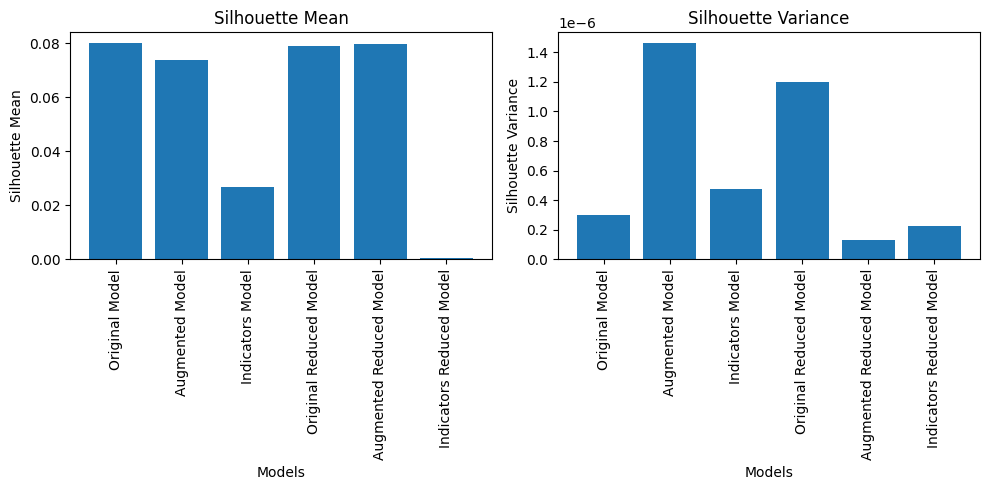

Silhouette scores (avg) on the original dataset:
Original Model (k = 2): 0.08001511614502586
Augmented Model (k = 2): 0.07386325039584699
Indicators Model (k = 9): 0.02671444665804585
Original Reduced Model (k = 2): 0.0789547158387669
Augmented Reduced Model (k = 2): 0.07951359703113958
Indicators Reduced Model (k = 2): 0.0004295523801174628


In [ ]:
n_samples = 5
sample_size = 5000
random_silhouettess = {}
for model, model_name in zip(best_models, MODEL_NAMES):
    silhouettes = []
    print(f'{model_name} (k = {len(model.cluster_centers_)}):')     
    for j in tqdm(range(0, n_samples)):   
        sampled_indeces = random.sample(range(df_orig_s.shape[0]), sample_size)
        sampled_points = [random_df_orig_s.iloc[i] for i in sampled_indeces]
        sampled_labels = [model.labels_[i] for i in sampled_indeces]
        silhouettes.append(silhouette_score(sampled_points, sampled_labels))
    random_silhouettess[model_name] = silhouettes
pd.DataFrame(random_silhouettess).to_csv('models/random_silhouette_on_orig.csv')

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
mvalues = [np.mean(silhouettes) for silhouettes in random_silhouettess.values()]
plt.bar(MODEL_NAMES, mvalues)
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Silhouette Mean')
plt.title('Silhouette Mean')

plt.subplot(1, 2, 2)
vvalues = [np.var(silhouettes) for silhouettes in random_silhouettess.values()]
plt.bar(MODEL_NAMES, vvalues)
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Silhouette Variance')
plt.title('Silhouette Variance')

plt.tight_layout()
plt.show()

print('Silhouette scores (avg) on the original dataset:')
for model, model_name, val in zip(best_models, MODEL_NAMES, mvalues):
    print(f'{model_name} (k = {len(model.cluster_centers_)}): {val}')

#### Clustering visualization (PCA)

/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with f

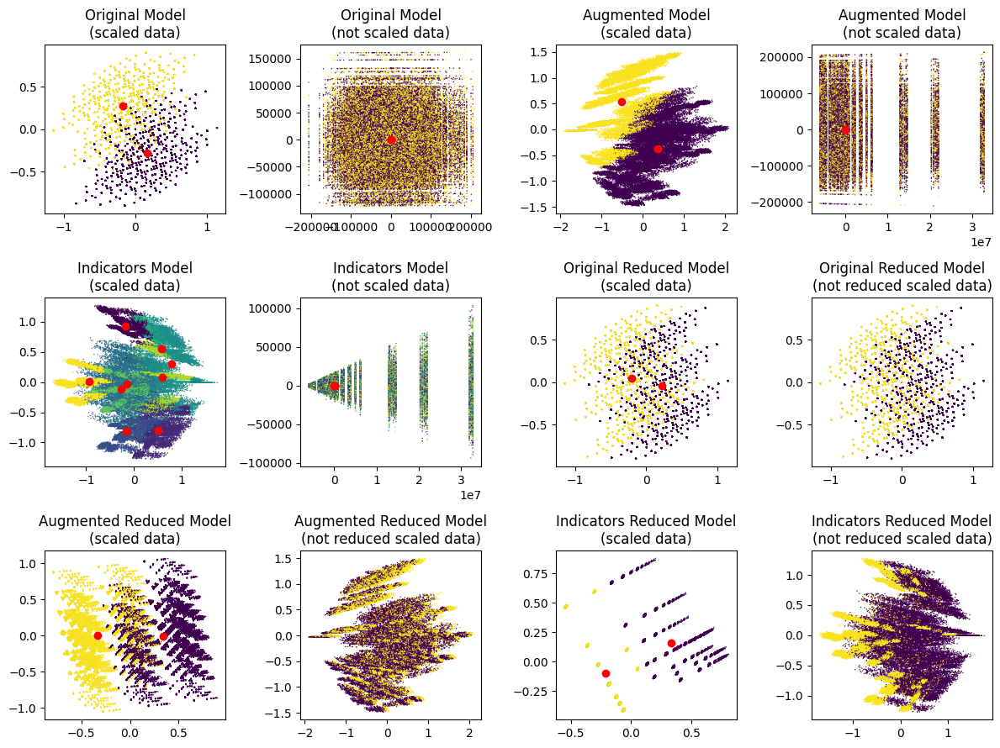

Original Model:
Cluster 0: 47723 points
Cluster 1: 47468 points

Augmented Model:
Cluster 0: 56372 points
Cluster 1: 38819 points

Indicators Model:
Cluster 0: 10397 points
Cluster 1: 9924 points
Cluster 2: 10050 points
Cluster 3: 11285 points
Cluster 4: 10901 points
Cluster 5: 6712 points
Cluster 6: 10493 points
Cluster 7: 9255 points
Cluster 8: 16174 points

Original Reduced Model:
Cluster 0: 47173 points
Cluster 1: 48018 points

Augmented Reduced Model:
Cluster 0: 47061 points
Cluster 1: 48130 points

Indicators Reduced Model:
Cluster 0: 37354 points
Cluster 1: 57837 points



In [ ]:
plt.figure(figsize=(12, 9))

for i, j in zip(range(len(best_models)), np.arange(1, len(best_models)*2, 2)):
    model = best_models[i]
    model_name = MODEL_NAMES[i]
    dataframe = random_dataframes[i]
    scaled_dataframe = random_scaled_dataframes[i]
    scaler = random_scalers[i]
    labels = model.labels_
    centroids = model.cluster_centers_
    points_pca_s, centroids_pca_s = perform_PCA(df=scaled_dataframe, centroids=centroids, n_components=2)

    plt.subplot(3, 4, j)
    plt.scatter(points_pca_s[:, 0], points_pca_s[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
    plt.scatter(centroids_pca_s[:, 0], centroids_pca_s[:, 1], c='red', marker='o')
    plt.title(f'{model_name}\n(scaled data)')

    plt.subplot(3, 4, j+1)
    if 'Reduced' in model_name:
        points_pca = perform_PCA(df=random_scaled_dataframes[i-3], n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.title(f'{model_name}\n(not reduced scaled data)')

    else:
        points_pca, centroids_pca = perform_PCA(df=dataframe, centroids=scaler.inverse_transform(centroids), n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], c='red', marker='o')
        plt.title(f'{model_name}\n(not scaled data)')

plt.tight_layout()
plt.show()

for model, model_name in zip(best_models, MODEL_NAMES):
    print(f'{model_name}:')
    cluster_labels, cluster_counts = np.unique(model.labels_, return_counts=True)
    for l, c in zip(cluster_labels, cluster_counts):
        print(f'Cluster {l}: {c} points')
    print('')

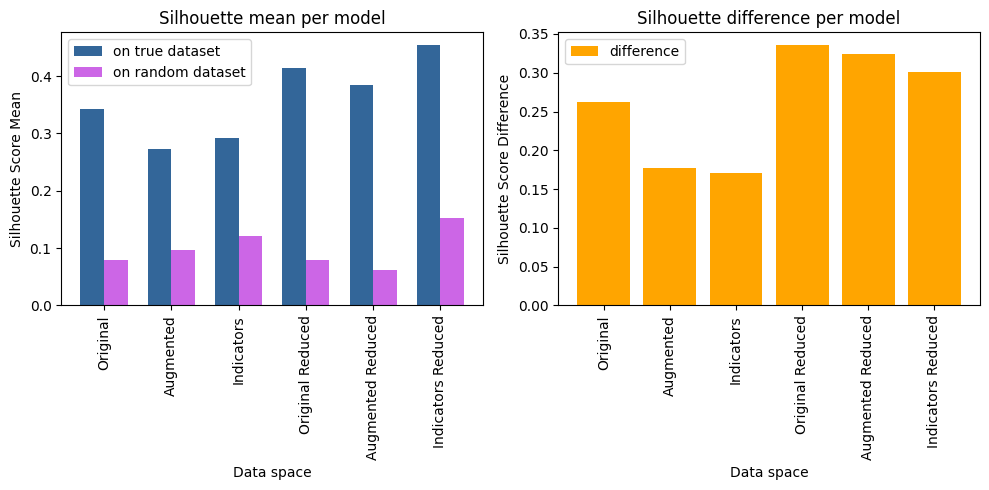

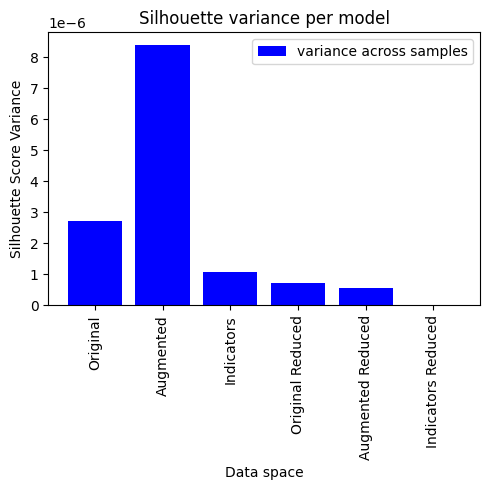

,Data space,k,Silhouette mean,Silhouette variance,Silhouette difference from random data clustering
0,Original,2,0.341907,2.716524e-06,0.262753
1,Augmented,4,0.273376,8.380057e-06,0.176836
2,Indicators,3,0.292416,1.092029e-06,0.170739
3,Original Reduced,2,0.415102,7.220957e-07,0.335372
4,Augmented Reduced,4,0.385371,5.471591e-07,0.324141
5,Indicators Reduced,2,0.453778,3.048582e-08,0.301485


In [213]:
# assessment: comparing obtained models with random data models
import json

file_names = ['orig', 'augm', 'ind', 'orig_r', 'augm_r', 'ind_r']
models = [joblib.load(f'models/best_kmeans_{f}_mms.pkl') for f in file_names]
model_names = ['Original', 'Augmented', 'Indicators']
model_names += [s+' Reduced' for s in model_names]
model_names += ['Random '+s for s in model_names]

df1 = pd.read_csv('models/model_score3s.csv')['Silhouette'].values
df2 = pd.read_csv('models/random_model_score3s.csv')['Silhouette'].values
silsss = [json.loads(s) for s in df1] + [json.loads(s) for s in df2]

sil_meanss = []
sil_varss = []
for i in range(len(model_names)):
        for j, sils in enumerate(silsss[i]):
                if sils != []:
                        sil_meanss.append(np.mean(sils))
                        sil_varss.append(np.var(sils))

plt.figure(figsize=(10, 5))

color_part1 = (0.2, 0.4, 0.6)
color_part2 = (0.8, 0.4, 0.9)
color_part3 = 'orange'

bar_width = 0.35
bar_positions_part1 = np.arange(len(model_names)/2)
bar_positions_part2 = bar_positions_part1 + bar_width

plt.subplot(1, 2, 1)
values = sil_meanss
values_part1 = values[0:6]
values_part2 = values[6:12]
plt.bar(bar_positions_part1, values_part1, width=bar_width, color=color_part1, label='on true dataset')
plt.bar(bar_positions_part2, values_part2, width=bar_width, color=color_part2, label='on random dataset')
plt.xticks(bar_positions_part1 + bar_width / 2, model_names[0:6], rotation=90)
plt.xlabel('Data space')
plt.ylabel('Silhouette Score Mean')
plt.title('Silhouette mean per model')
plt.legend()

diffs = [v1-v2 for v1, v2 in zip(values_part1, values_part2)]

plt.subplot(1, 2, 2)
plt.bar(model_names[0:6], diffs, color=color_part3, label='difference')
plt.xticks(model_names[0:6], rotation=90)
plt.xlabel('Data space')
plt.ylabel('Silhouette Score Difference')
plt.title('Silhouette difference per model')
plt.legend()

plt.tight_layout()
plt.show()

plt.figure(figsize=(5, 5))
values = sil_varss[0:6]
plt.bar(model_names[0:6], values, color='blue', label='variance across samples')
plt.xticks(model_names[0:6], rotation=90)
plt.xlabel('Data space')
plt.ylabel('Silhouette Score Variance')
plt.title('Silhouette variance per model')
plt.legend()

plt.tight_layout()
plt.show()

res_dict = {
        'Data space': model_names[0:6],
        'k': [len(model.cluster_centers_) for model in models],
        'Silhouette mean': sil_meanss[0:6],
        'Silhouette variance': sil_varss[0:6],
        'Silhouette difference from random data clustering': diffs
}
display(pd.DataFrame(res_dict))

---
## Analysis

#### Original data clustering

Original Model


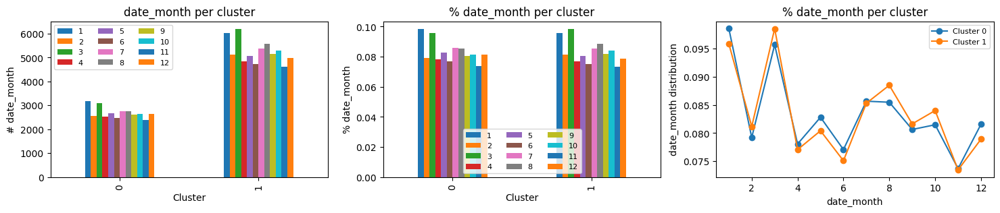

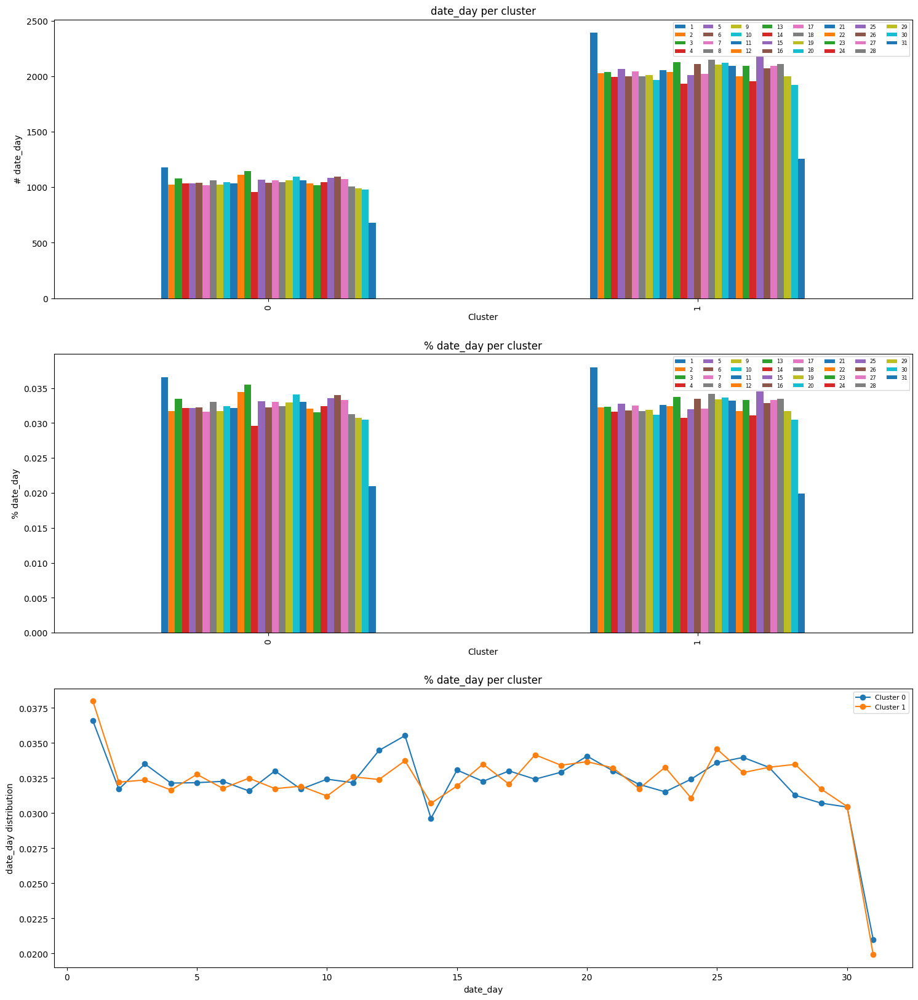

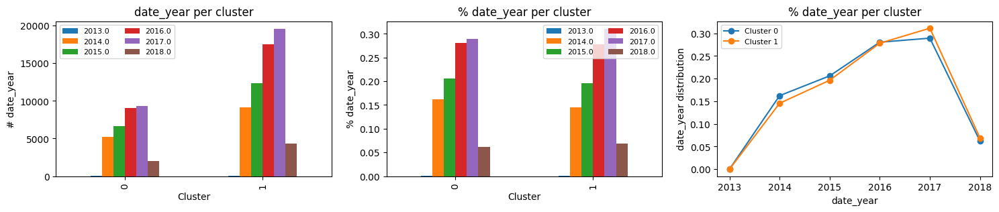

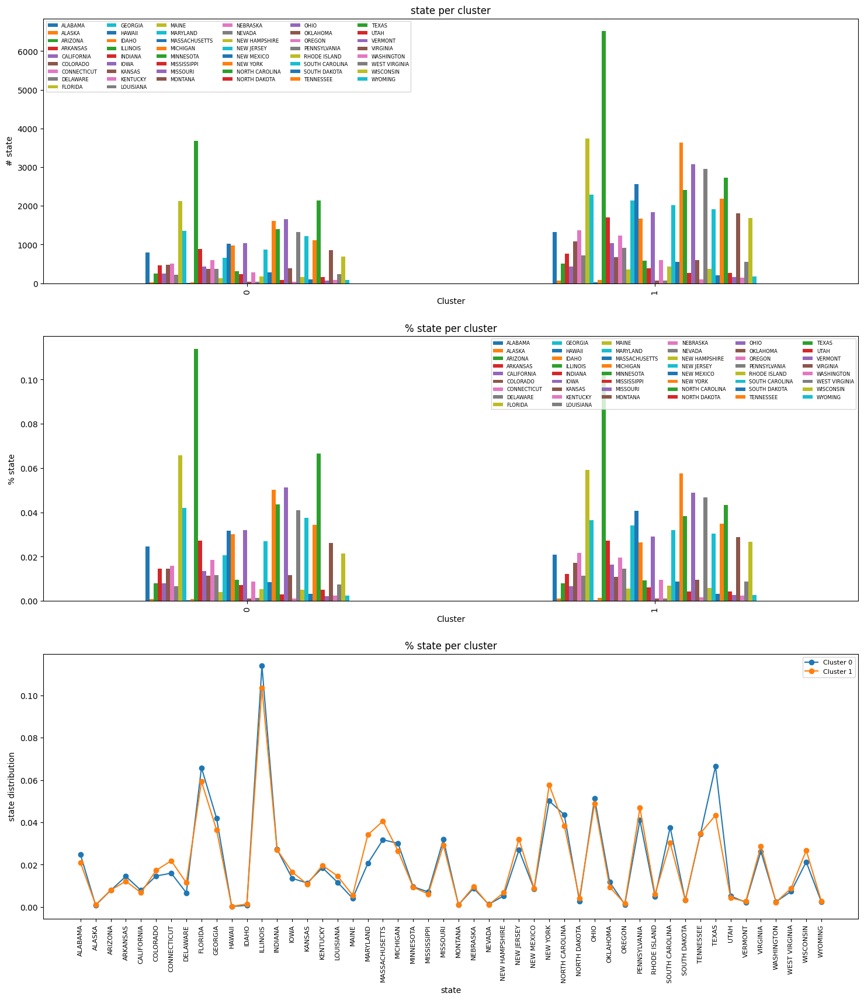

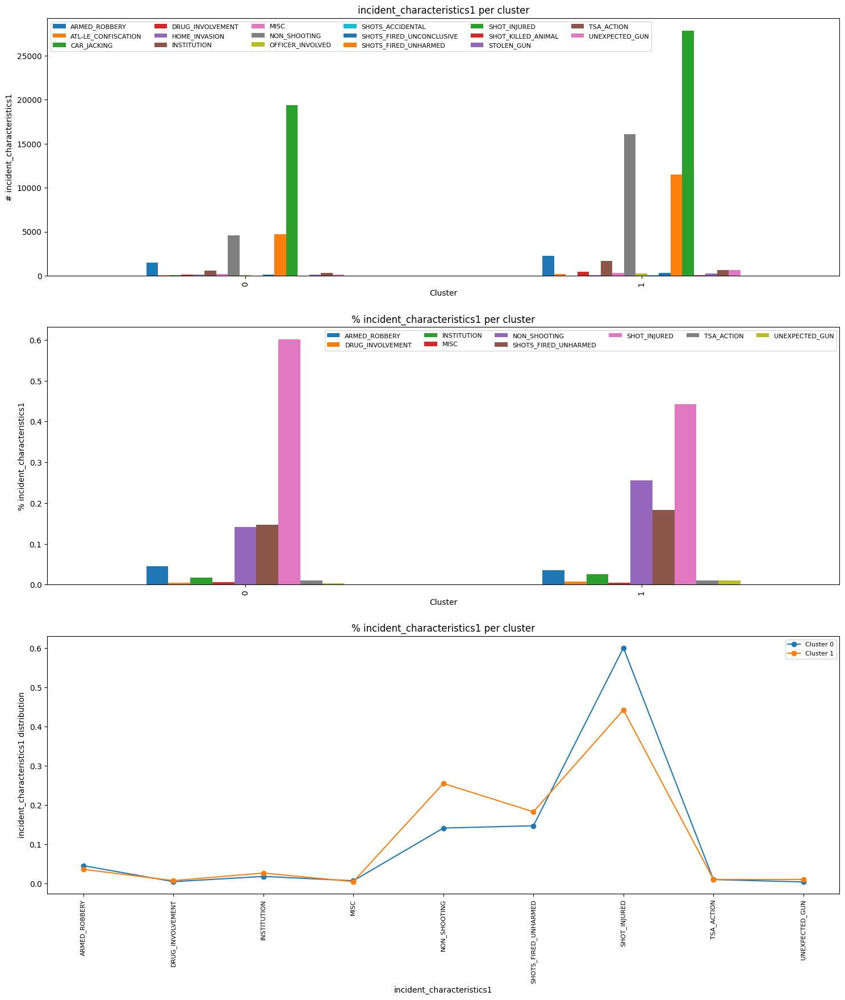

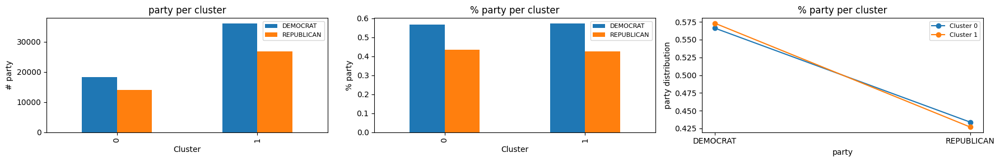

Augmented Model


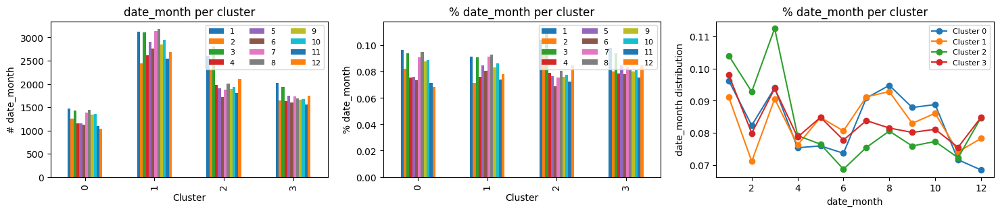

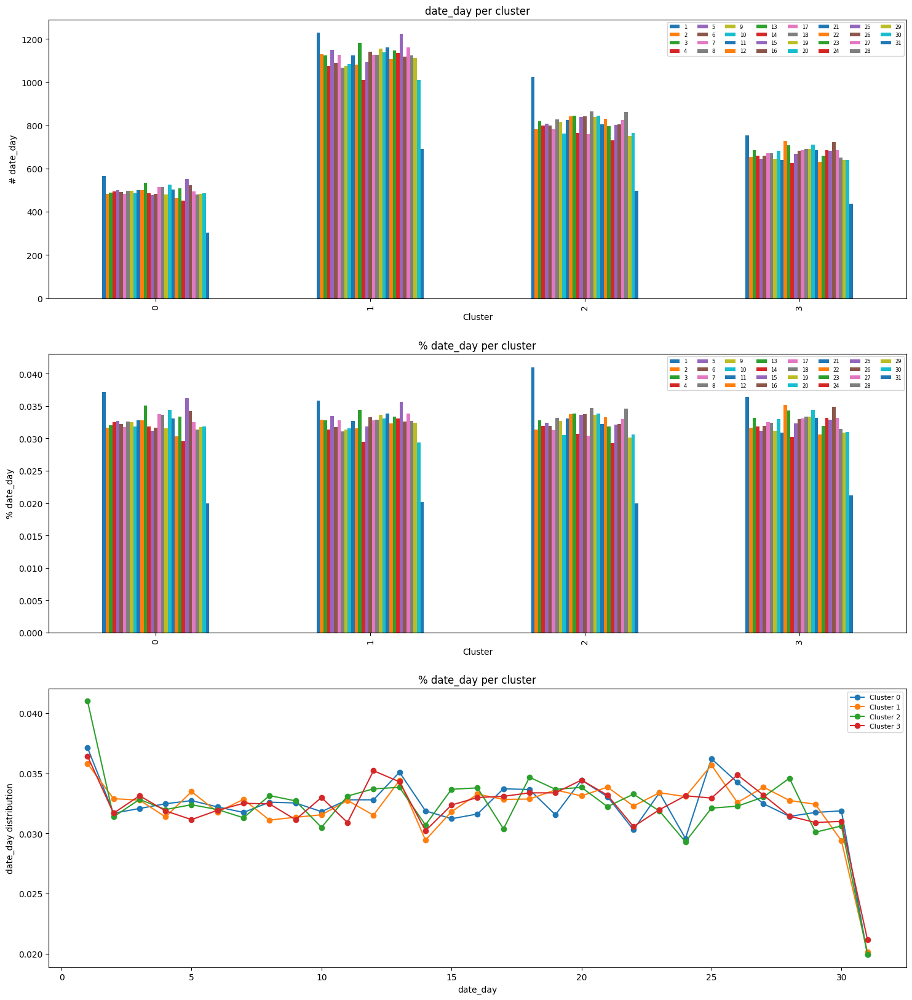

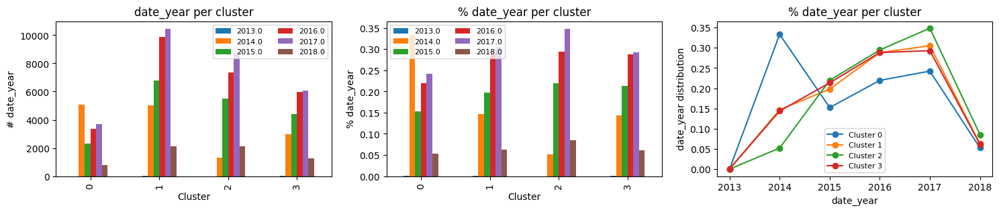

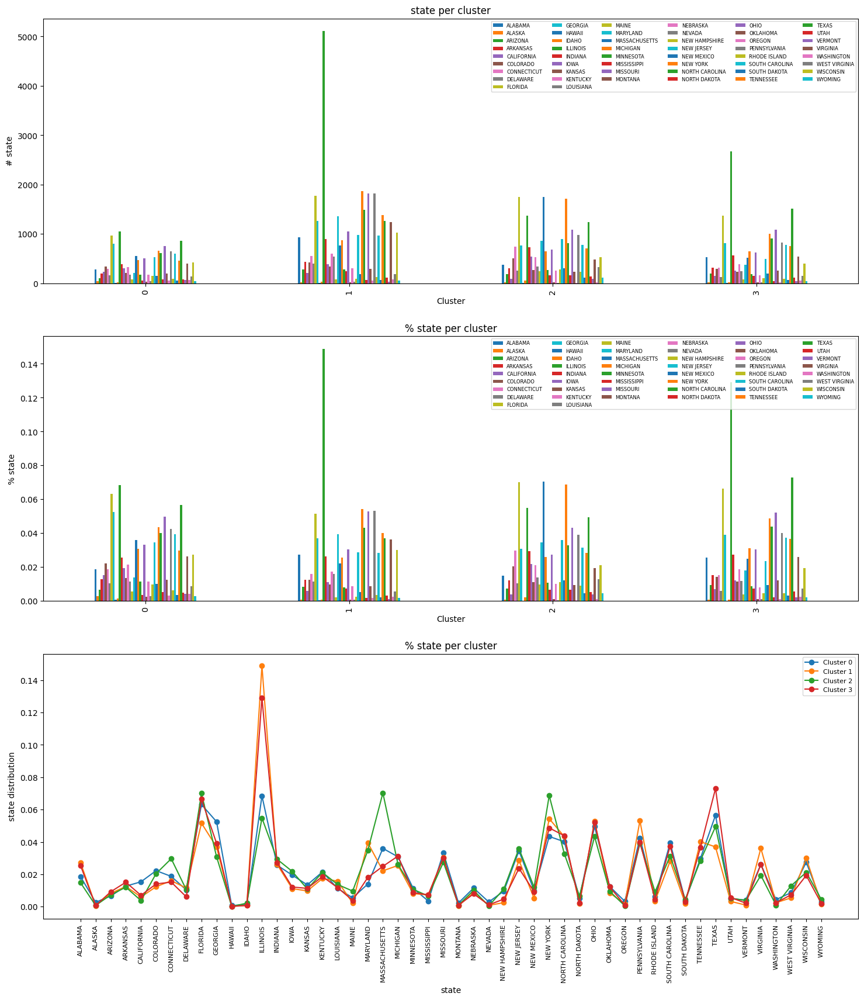

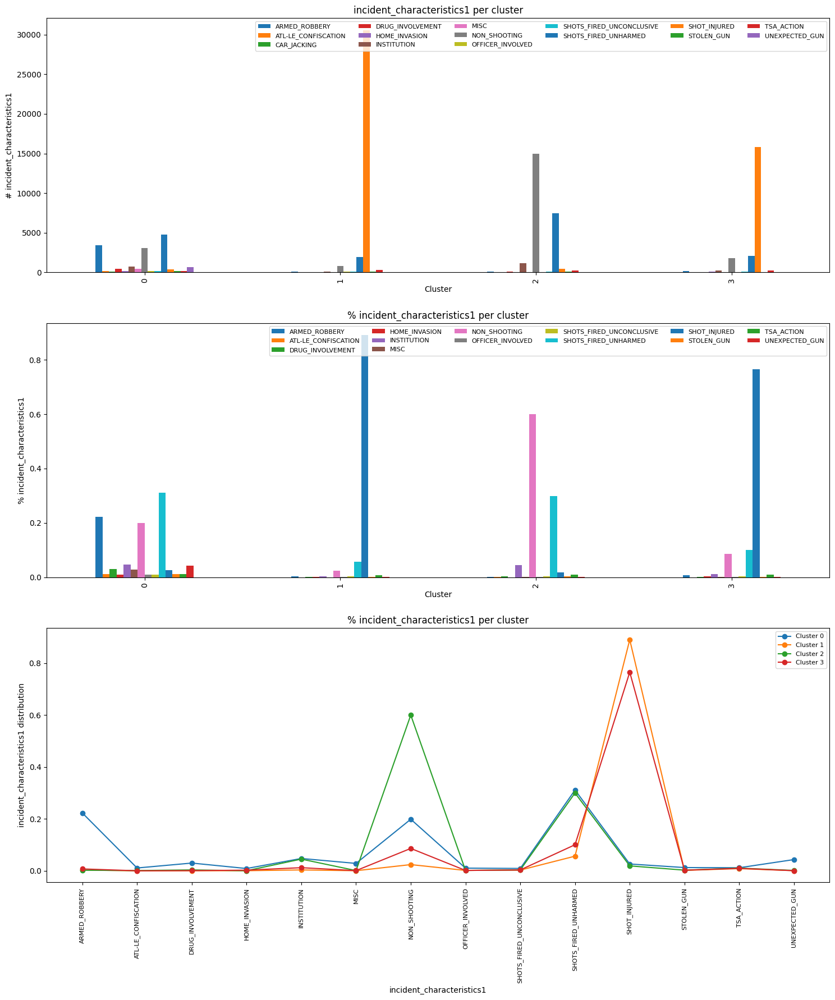

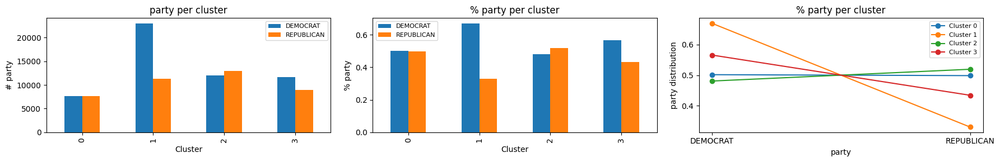

Indicators Model


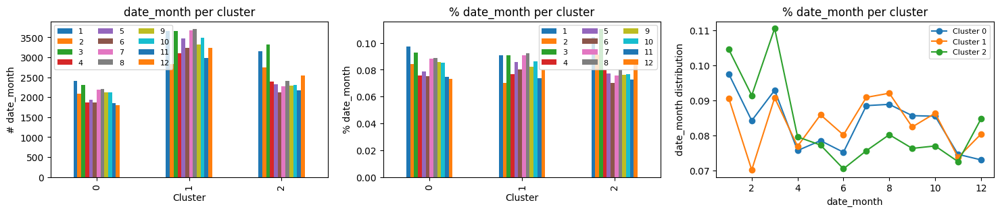

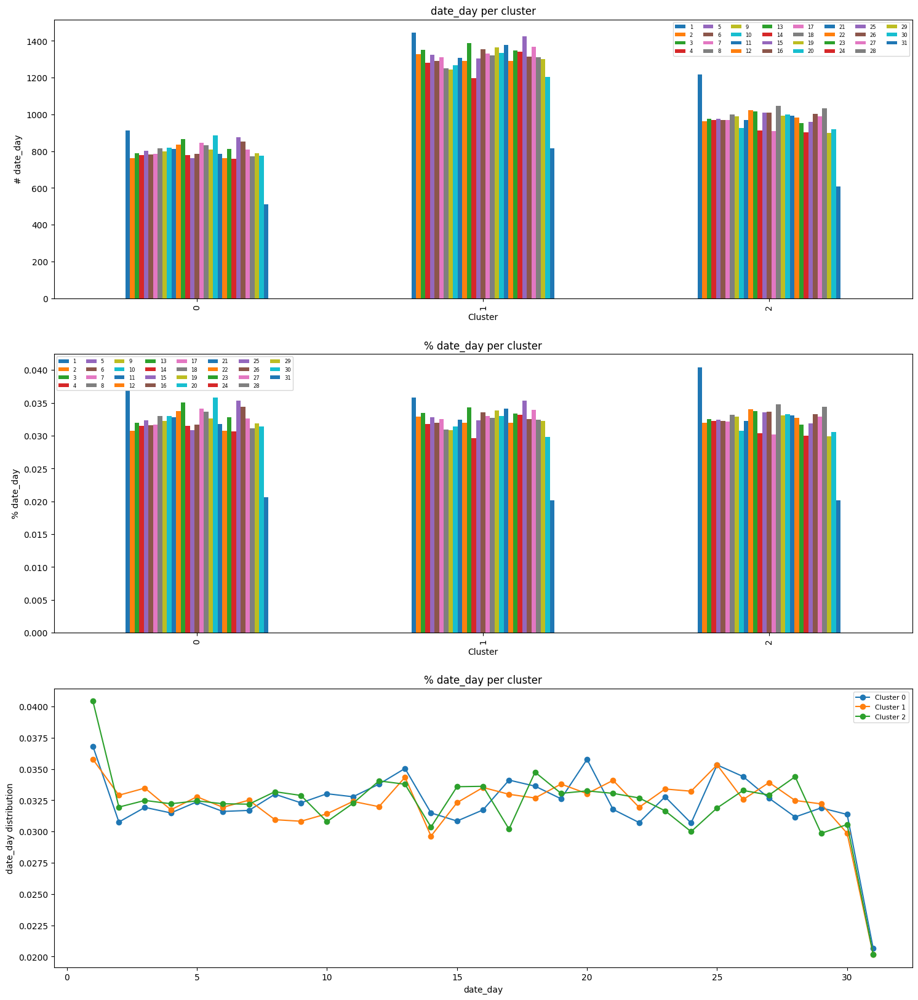

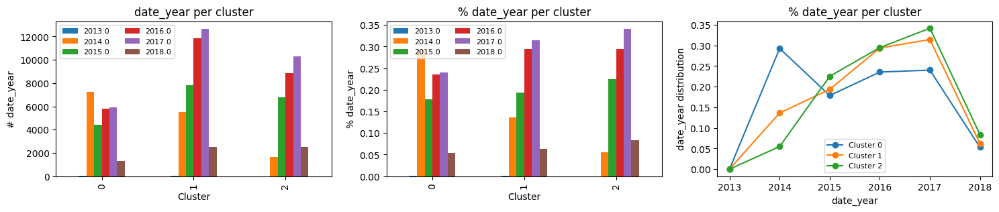

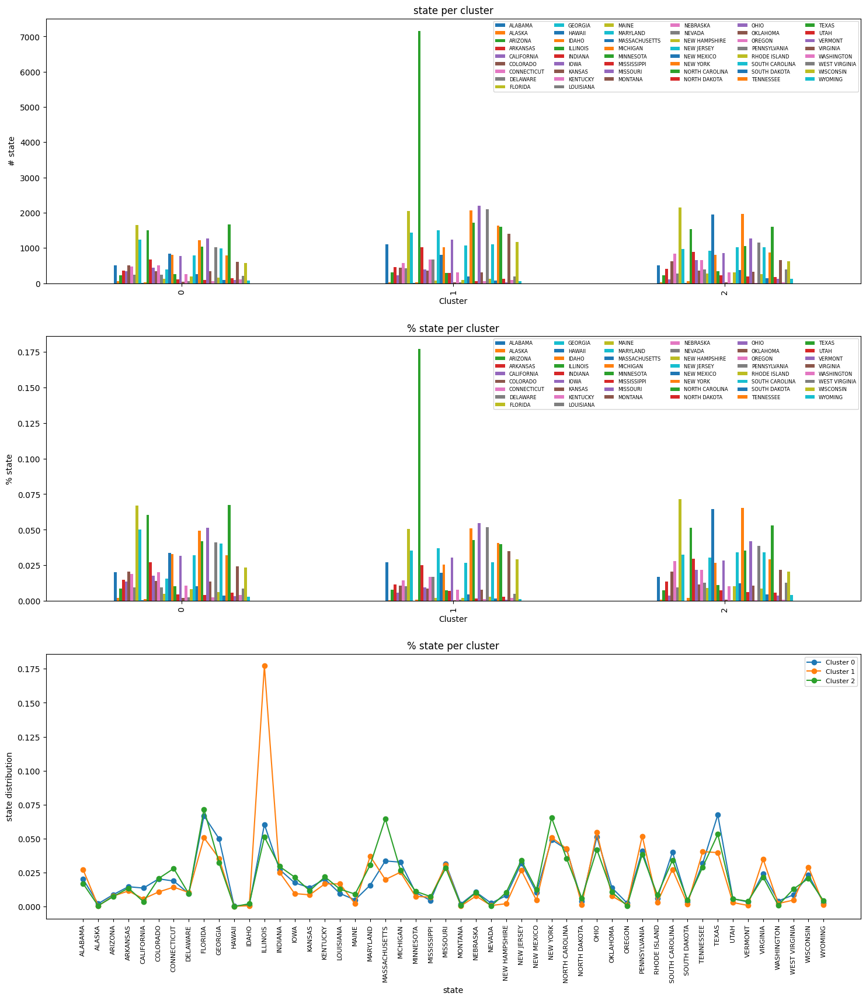

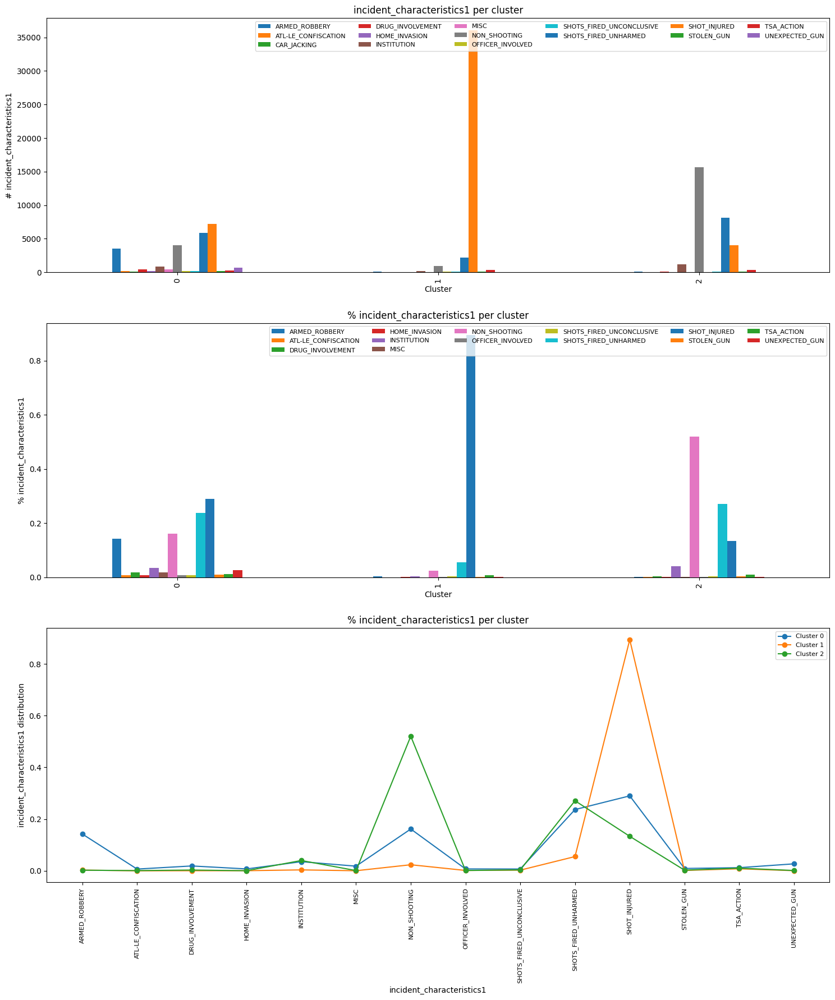

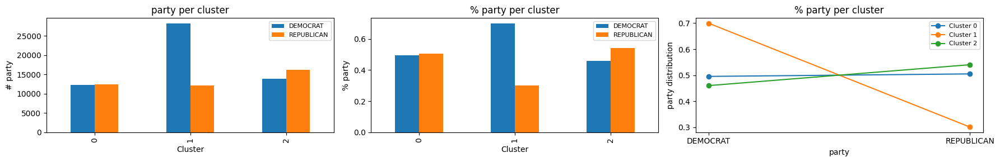

Original Reduced Model


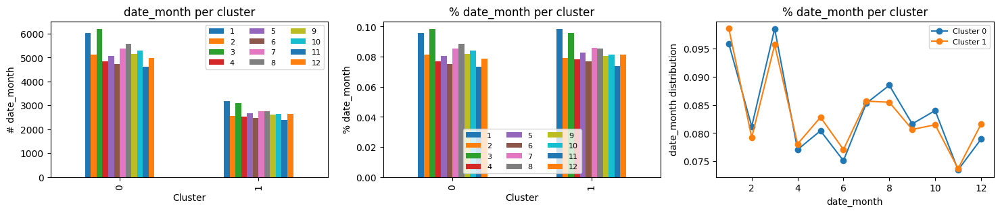

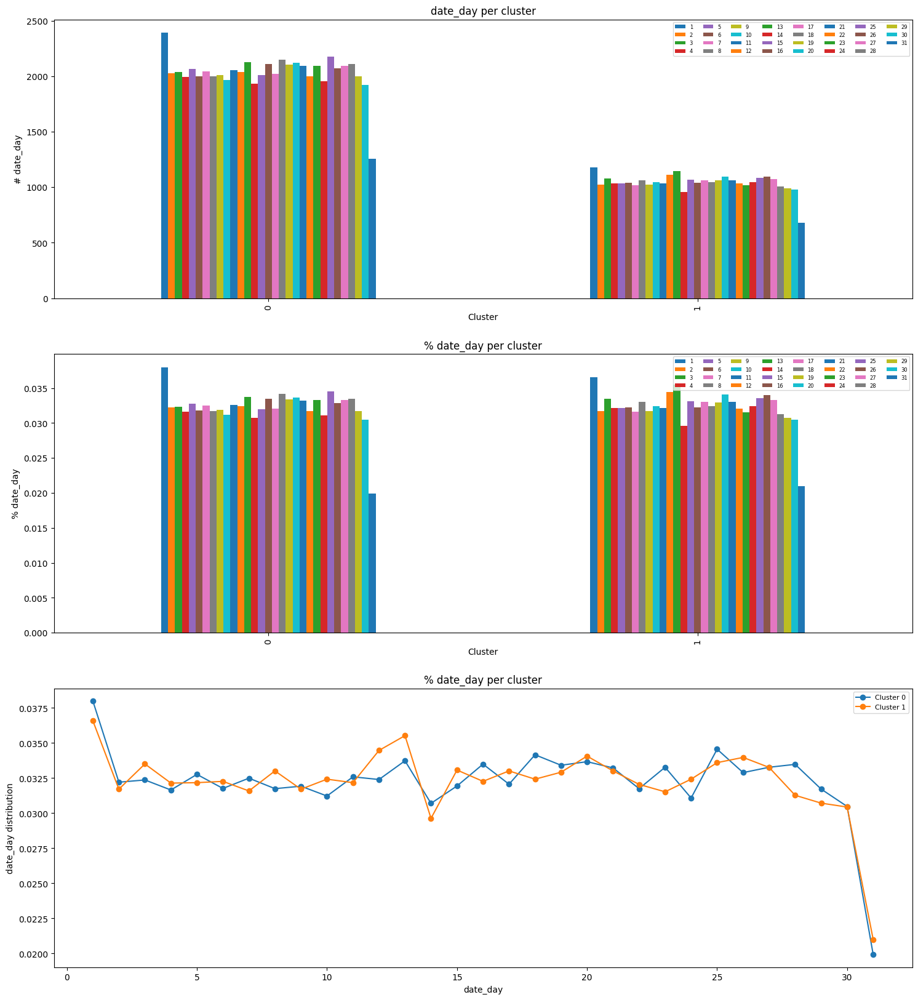

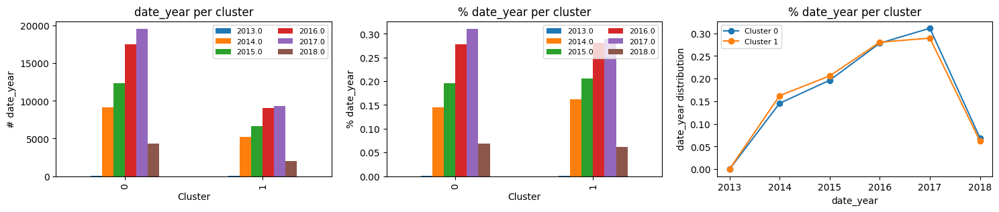

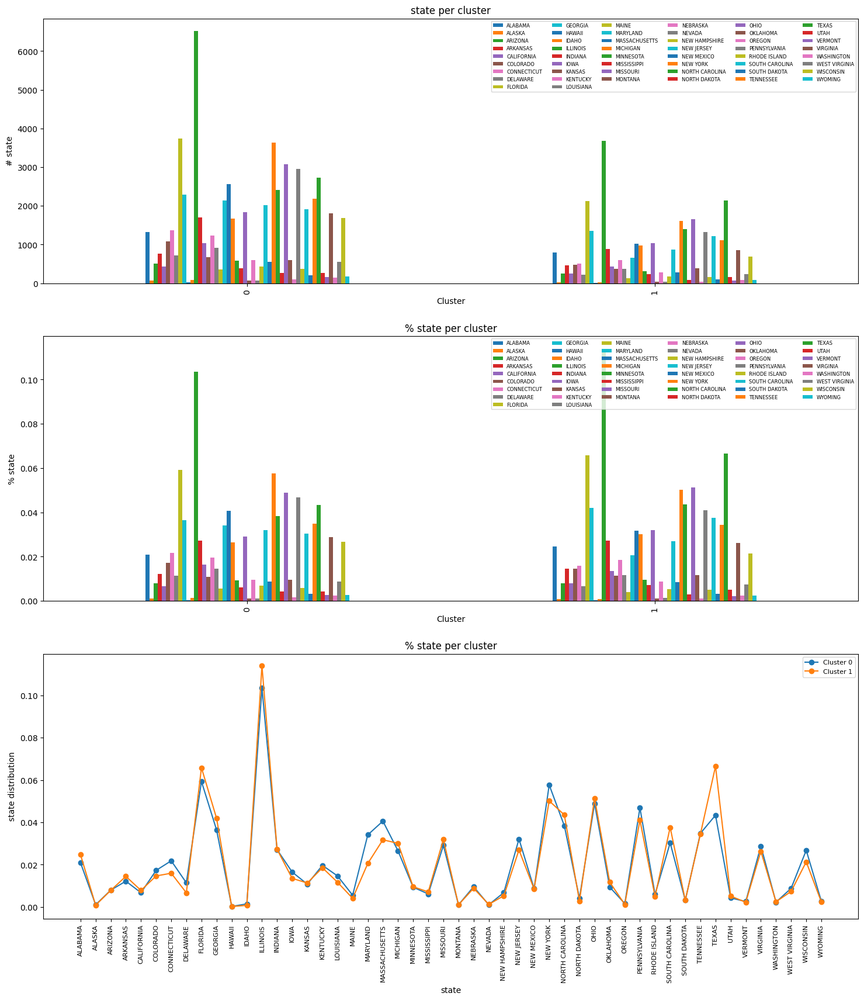

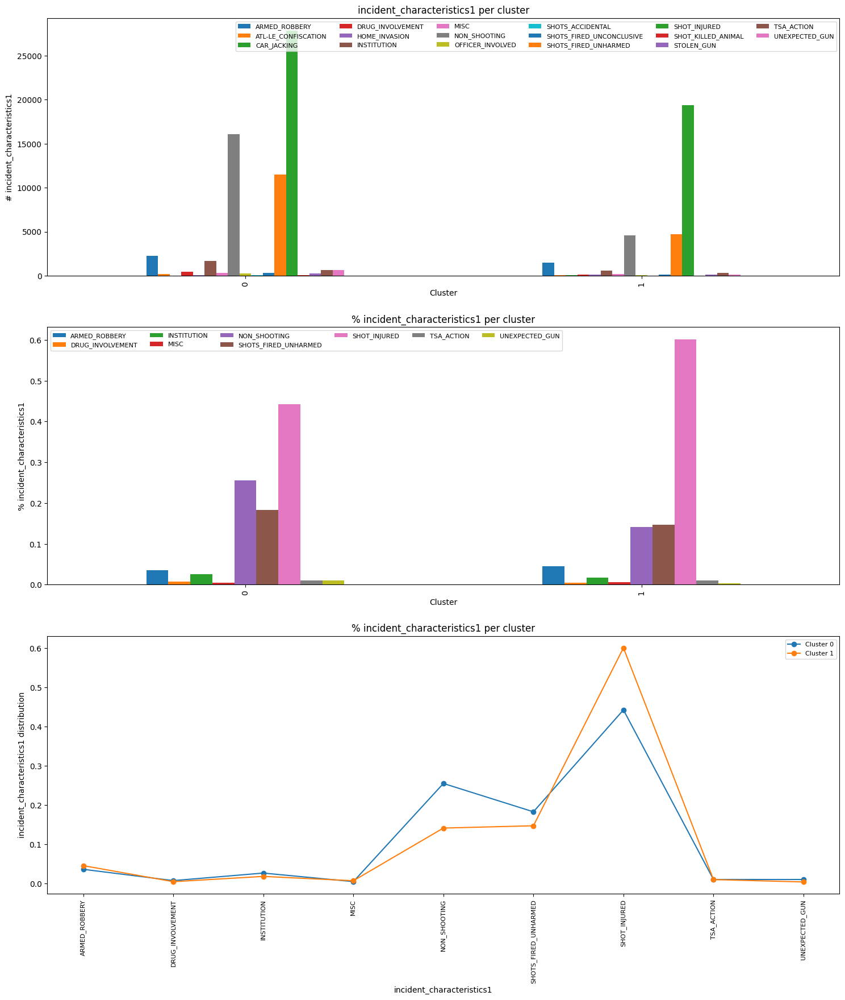

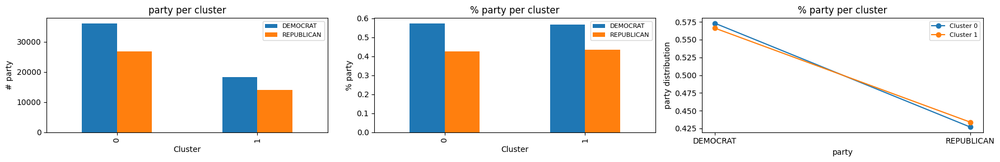

Augmented Reduced Model


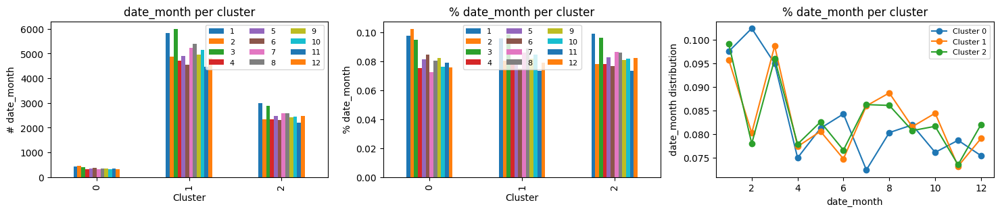

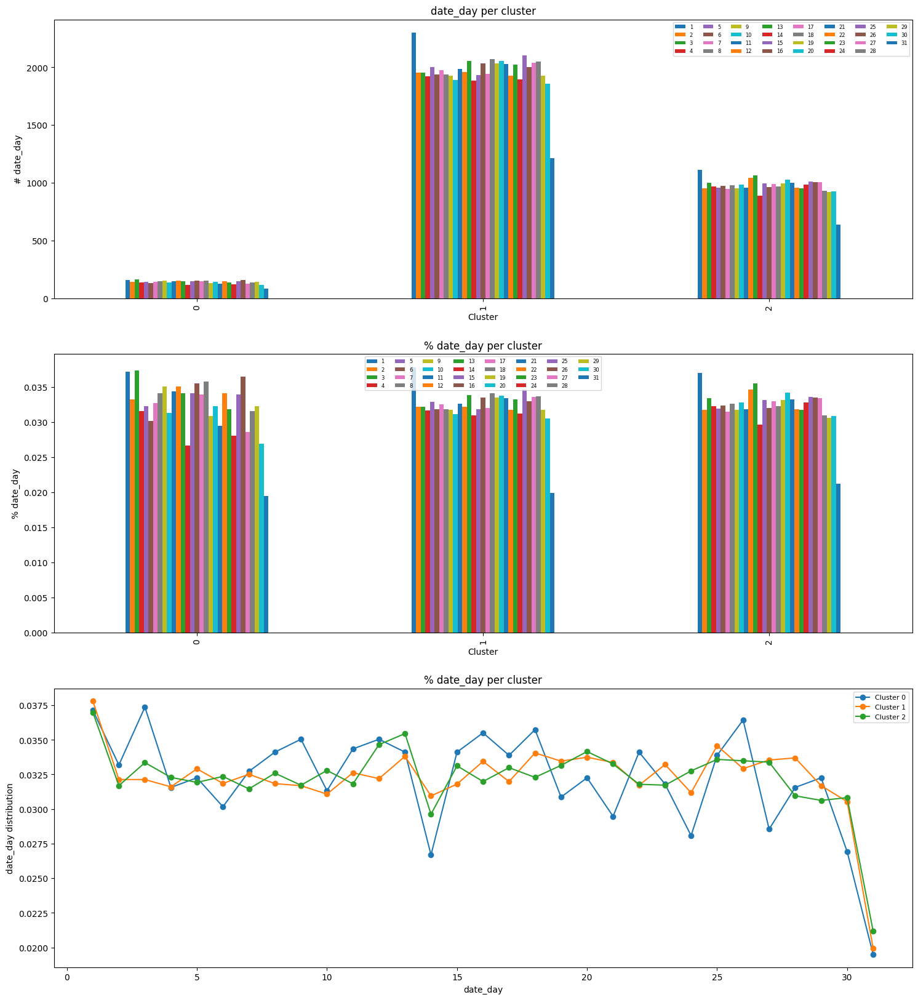

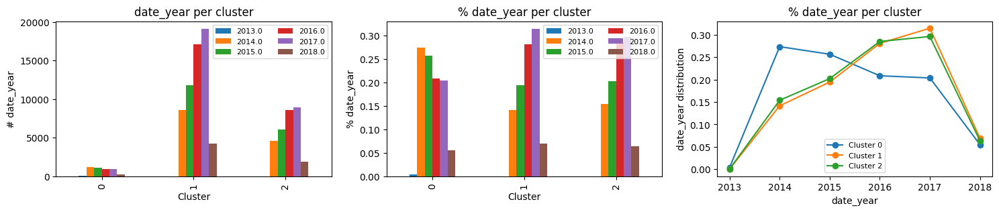

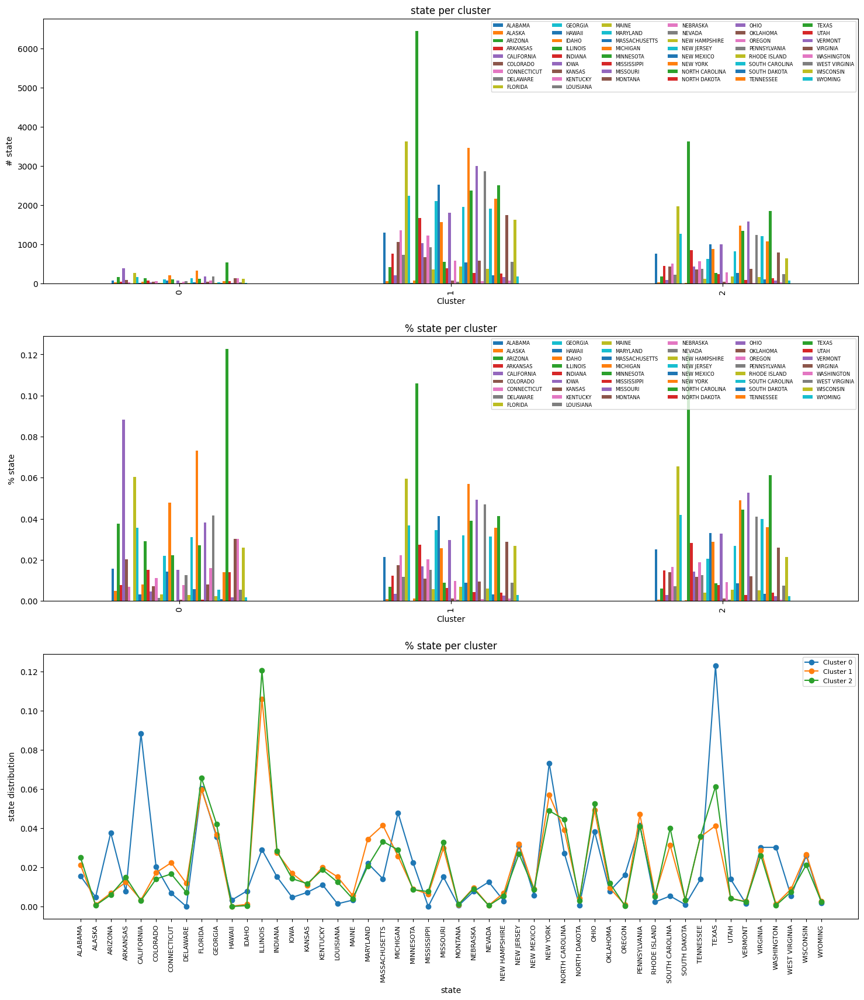

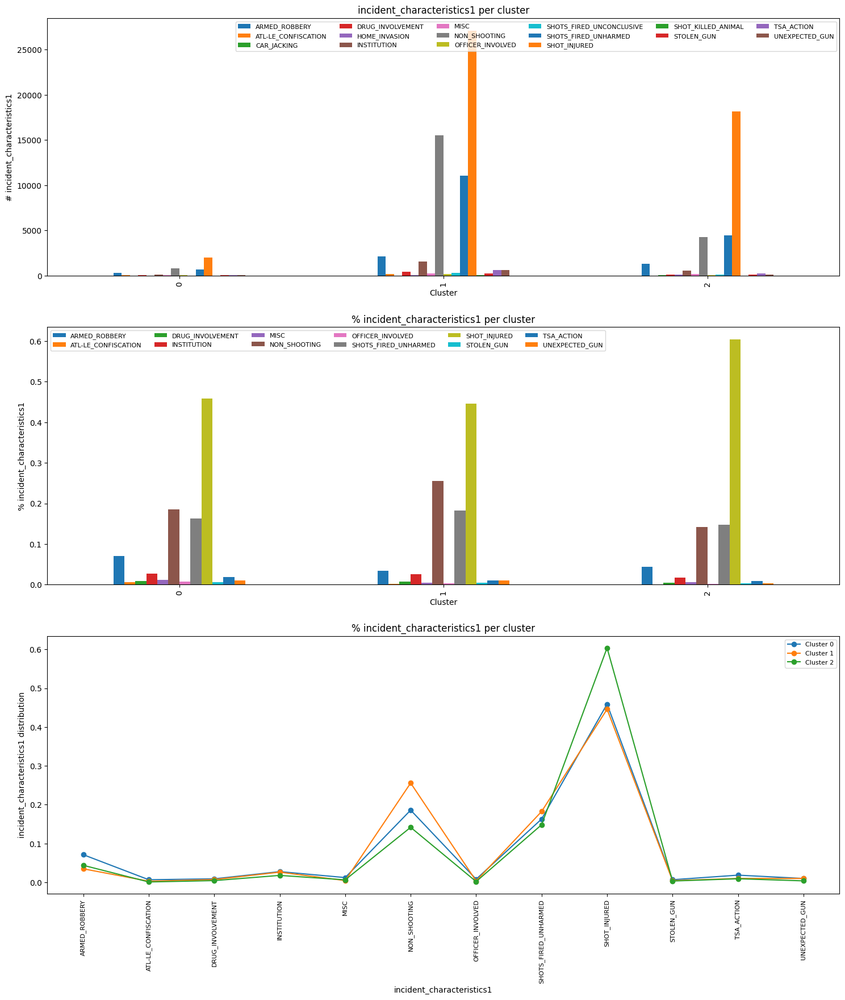

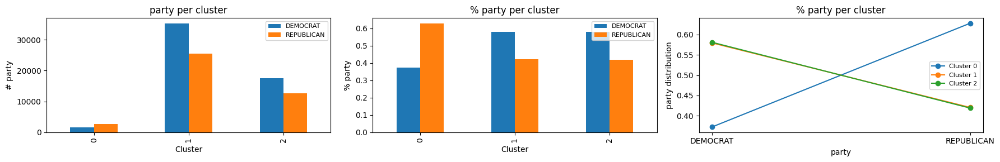

Indicators Reduced Model


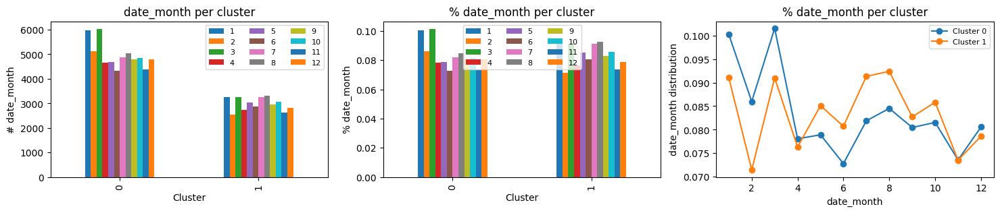

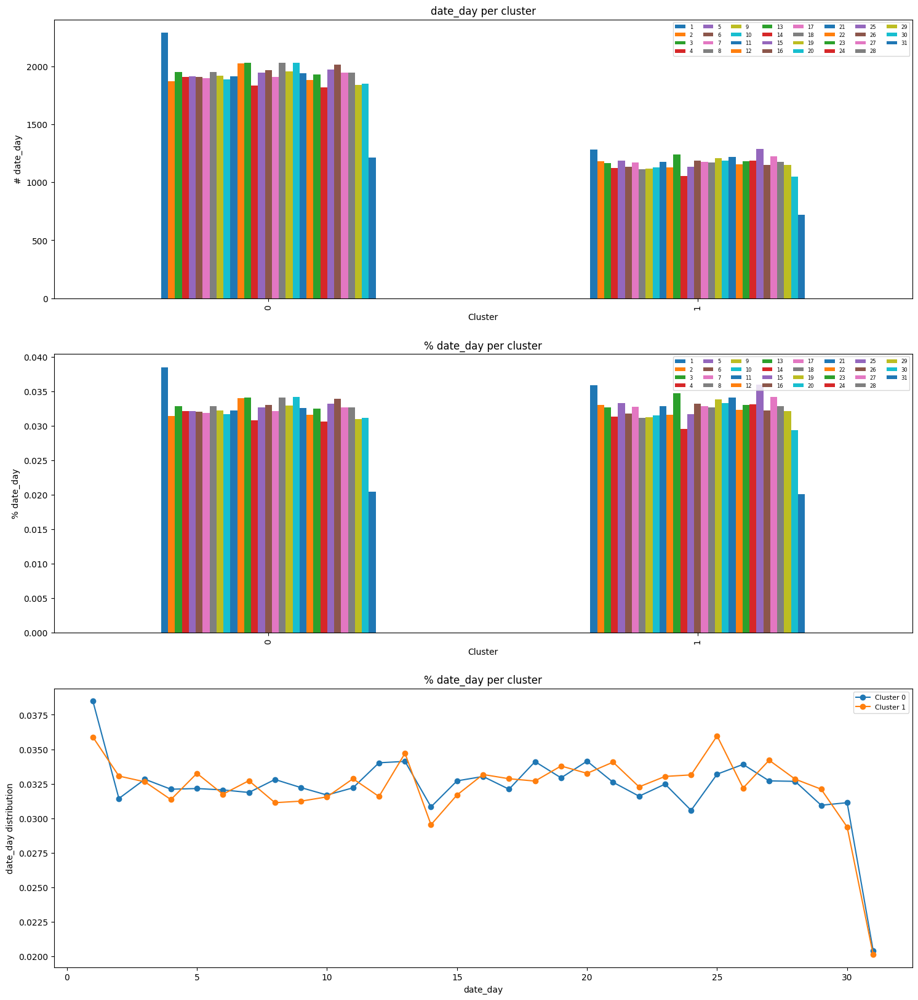

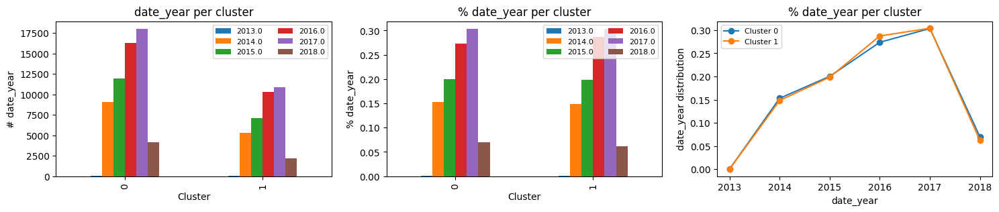

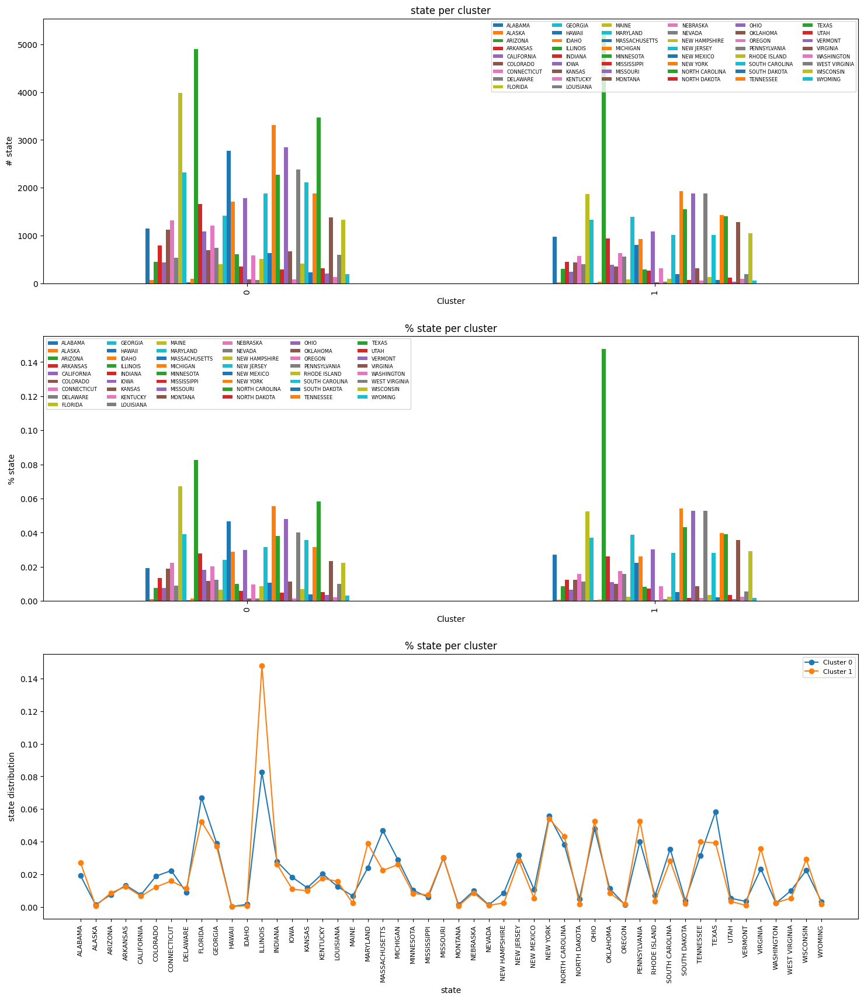

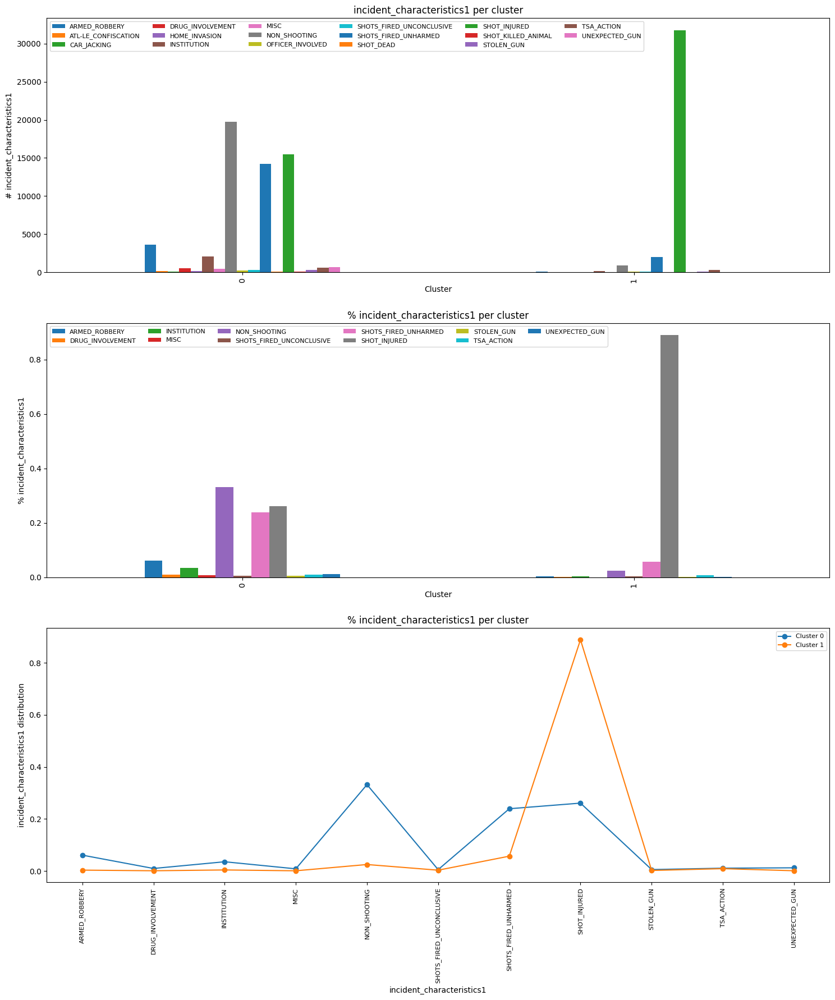

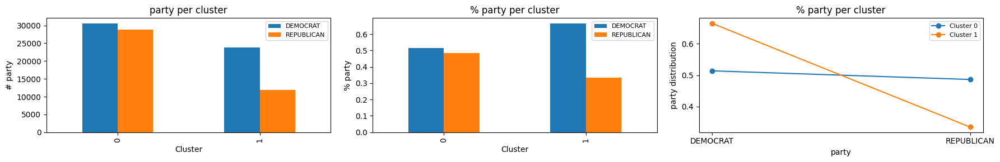

In [224]:
categorical_cols = ['date_month', 'date_day', 'date_year', 'state', 'incident_characteristics1', 'party']
df_c = df_init[categorical_cols]
file_names = ['orig', 'augm', 'ind', 'orig_r', 'augm_r', 'ind_r']
all_models = [joblib.load(f'models/best_kmeans_{f}_mms.pkl') for f in file_names]

n_models = len(all_models)
model_names = MODEL_NAMES+[s+' 2' for s in MODEL_NAMES]

for model, model_name in zip(all_models, model_names):
    print(model_name)
    for cat in categorical_cols:

        xt_pct = pd.crosstab(model.labels_, df_c[cat])

        a = xt_pct.values
        cols = xt_pct.columns
        ps = []
        for i in range(len(cols)):
            ps.append([])

        for row in a:
            dist = row / np.sum(row)
            for i in range(len(cols)):
                ps[i].append(dist[i])

        d = {}
        i = 0
        for c in cols:
            d[c] = ps[i]
            i += 1

        xt_pct_p = pd.DataFrame(d)
        if cat == 'incident_characteristics1':
            xt_pct_p = xt_pct_p.loc[:, (xt_pct_p > 0.005).any(axis=0)]
            xt_pct = xt_pct.loc[:, (xt_pct > 50).any(axis=0)]

        distrs = xt_pct_p.values
        cols = xt_pct_p.columns
        avg_distr = np.mean(distrs, axis=0)
        
    #----------------------------------------------
        if (cat == 'party' or cat == 'date_month' or cat == 'date_year') and (len(model.cluster_centers_) <= 6):
            fig, axes = plt.subplots(1, 3, figsize=(18, 3))
        else:
            fig, axes = plt.subplots(3, 1, figsize=(18, 20))

        if len(cols) > 30:
            fs = 6
        else:
            fs = 8

        if cat == 'state' or cat == 'incident_characteristics1':
            ncol = 6
        else:
            ncol = ceil(len(cols) / 4)

        xt_pct.plot(kind='bar', stacked=False, title=f'{cat} per cluster', ax=axes[0])
        
        axes[0].legend(fontsize=fs, loc='best', ncol=ncol)
        axes[0].set_xlabel('Cluster')
        axes[0].set_ylabel(f'# {cat}')

        xt_pct_p.plot(kind='bar', stacked=False, title=f'% {cat} per cluster', ax=axes[1])
        axes[1].legend(fontsize=fs, loc='best', ncol=ncol)
        axes[1].set_xlabel('Cluster')
        axes[1].set_ylabel(f'% {cat}')

        for i in range(len(model.cluster_centers_)):
            line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')
            if cat == 'state' or cat == 'incident_characteristics1':
                axes[2].set_xticks(range(len(cols)), cols, rotation=90, fontsize=8)

        ncol = ceil(len(model.cluster_centers_) / 4)
        axes[2].legend(fontsize=8, loc='best', ncol=ncol)
        axes[2].set_xlabel(cat)
        axes[2].set_ylabel(f'{cat} distribution')
        axes[2].set_title(f'% {cat} per cluster')

    plt.tight_layout()
    plt.show()

Original Model


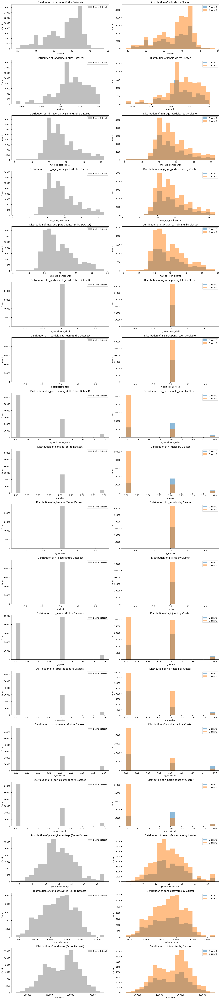

Augmented Model


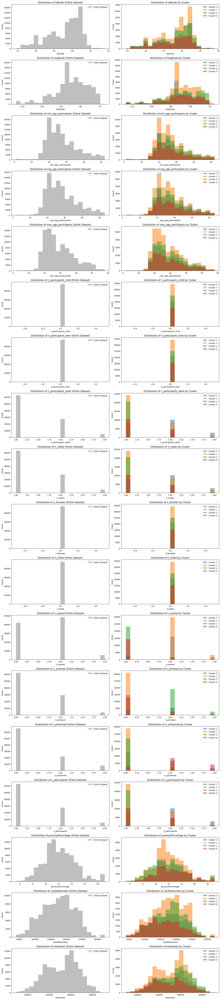

Indicators Model


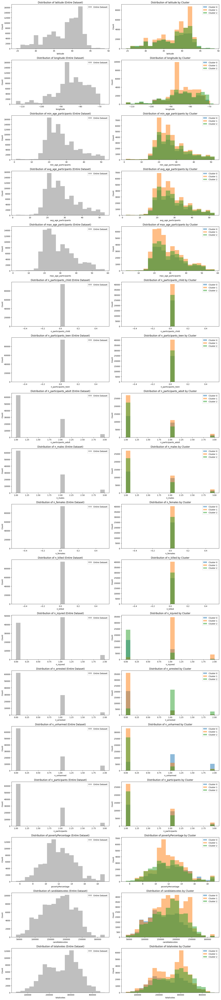

Original Reduced Model


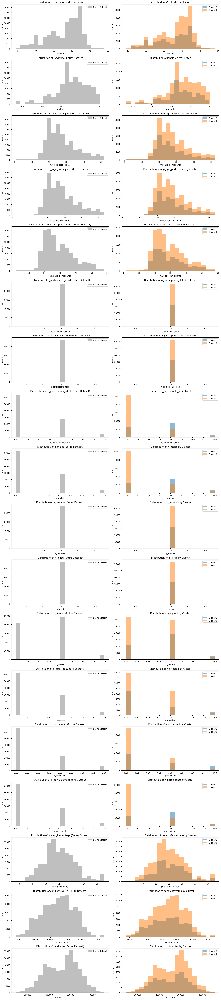

Augmented Reduced Model


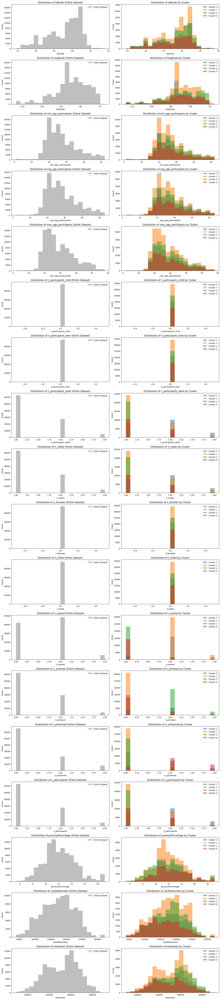

Indicators Reduced Model


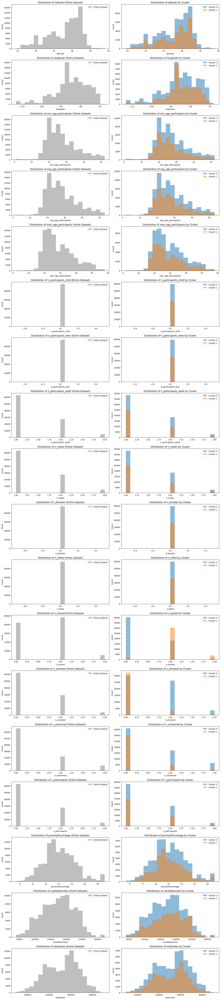

In [167]:
file_names = ['orig', 'augm', 'ind', 'orig_r', 'augm_r', 'ind_r']
df_c = df_init[orig_num_cols]
all_models = [joblib.load(f'models/best_kmeans_{f}_mms.pkl') for f in file_names]

n_models = len(all_models)
model_names = MODEL_NAMES+[s+' 2' for s in MODEL_NAMES]

for model, model_name in zip(all_models, model_names):
    print(model_name)
    df_temp = df_c.copy()
    df_temp['Cluster'] = model.labels_

    # Set up subplots based on the number of numerical attributes
    num_cols = len(orig_num_cols)
    fig, axes = plt.subplots(nrows=num_cols, ncols=2, figsize=(16, 4 * num_cols))

    # Loop through numerical columns
    for i, col in enumerate(orig_num_cols):
        # Plot distribution in the entire dataset
        axes[i, 0].hist(df_temp[col], alpha=0.5, color='gray', label='Entire Dataset', bins=20)
        axes[i, 0].set_title(f'Distribution of {col} (Entire Dataset)')
        axes[i, 0].set_xlabel(col)
        axes[i, 0].set_ylabel('Count')
        axes[i, 0].legend()

        # Plot distributions for each cluster
        for cluster_label in df_temp['Cluster'].unique():
            cluster_data = df_temp[df_temp['Cluster'] == cluster_label][col]
            axes[i, 1].hist(cluster_data, alpha=0.5, label=f'Cluster {cluster_label}', bins=20)

        axes[i, 1].set_title(f'Distribution of {col} by Cluster')
        axes[i, 1].set_xlabel(col)
        axes[i, 1].set_ylabel('Count')
        axes[i, 1].legend()

    plt.tight_layout()
    plt.show()